# Initial LCMV analysis: QC on the 3 samples separately

In [1]:
from itertools import permutations
from pandas.api.types import CategoricalDtype
from plotnine import * 
from scipy.cluster.hierarchy import dendrogram, linkage, set_link_color_palette
from scipy.stats import gmean, mannwhitneyu
import anndata as ad
import matplotlib as mpl
import matplotlib.pyplot as plt 
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns

sc.set_figure_params(figsize=(5,4), vector_friendly=False)


/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


## start with SNH sample1

In [2]:
sample1_data = sc.read_10x_mtx("data/SNH1_filtered_feature_bc_matrix/", gex_only = False)

In [3]:
sample1_data.var

,gene_ids,feature_types
Xkr4,ENSMUSG00000051951,Gene Expression
Gm1992,ENSMUSG00000089699,Gene Expression
Gm19938,ENSMUSG00000102331,Gene Expression
Gm37381,ENSMUSG00000102343,Gene Expression
Rp1,ENSMUSG00000025900,Gene Expression
...,...,...
M14_biotin,9,Custom
M16_biotin,10,Custom
M16,11,Custom
biotin_interaction,C0436,Custom


In [4]:
s1_hto = sample1_data[:,sample1_data.var_names[sample1_data.var.feature_types == "Custom"]]
s1_hto.shape

(11050, 13)

In [5]:
sample1_data = sample1_data[:,sample1_data.var_names[sample1_data.var.feature_types != "Custom"]]

In [6]:
sample1_data.shape

(11050, 32285)

In [7]:
sample1_data.var['mt'] = sample1_data.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(sample1_data, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

/tmp/ipykernel_293954/4123806329.py:1: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.


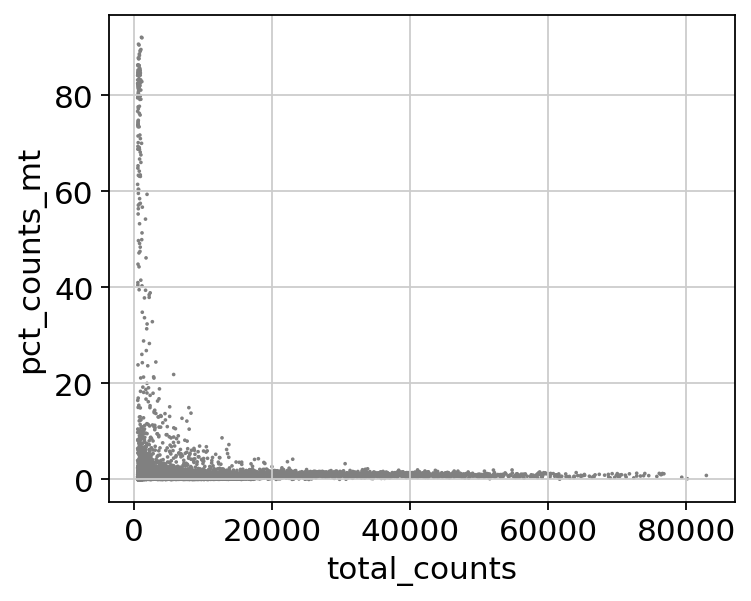

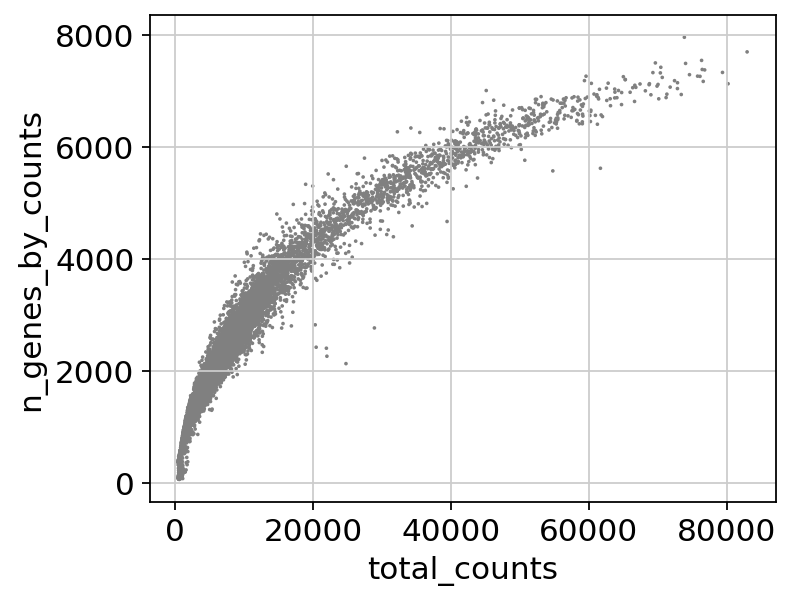

In [8]:
sc.pl.scatter(sample1_data, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(sample1_data, x='total_counts', y='n_genes_by_counts') 

## filter by high mitochondria

In [10]:
sample1_data = sample1_data[sample1_data.obs["pct_counts_mt"] <= 15]

In [11]:
sample1_data.shape

(10885, 32285)

In [12]:
## number cells filtered out
11050-10885

165

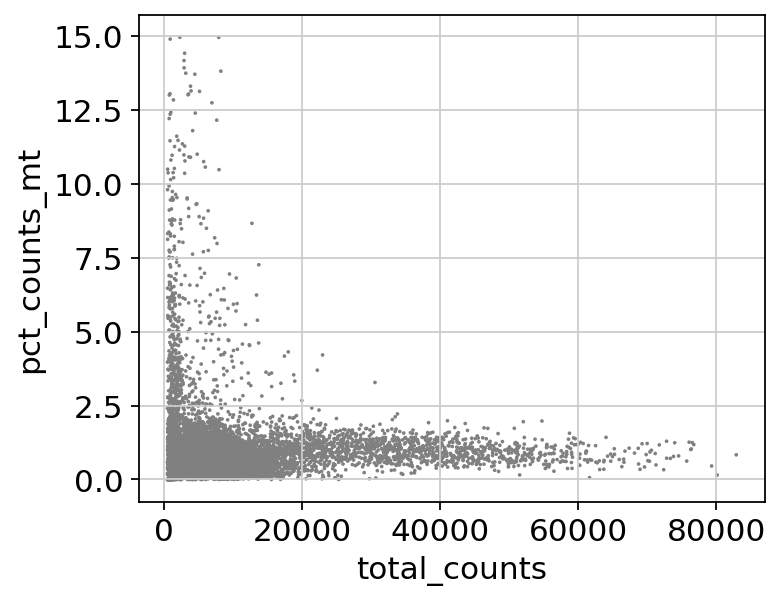

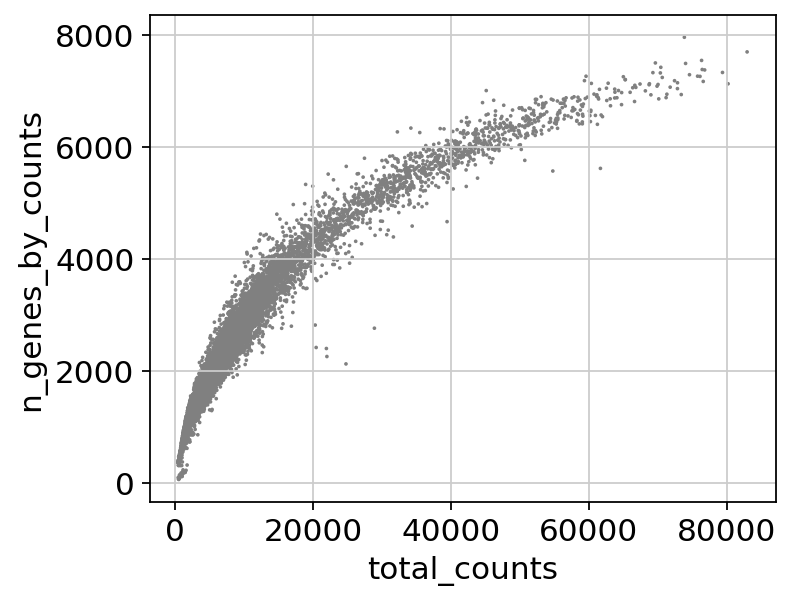

In [13]:
sc.pl.scatter(sample1_data, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(sample1_data, x='total_counts', y='n_genes_by_counts') 

## filter by high total counts

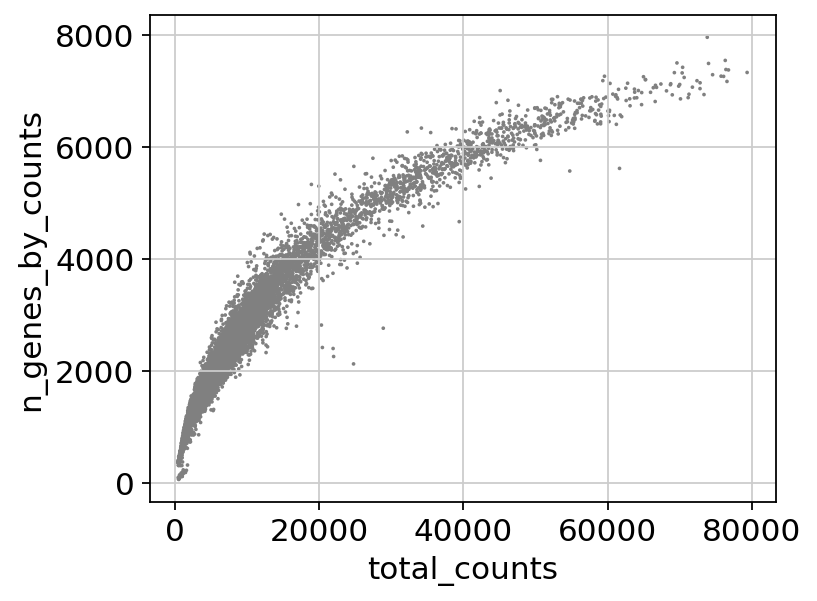

In [14]:
sample1_data = sample1_data[sample1_data.obs["total_counts"] <= 80000]
sc.pl.scatter(sample1_data, x='total_counts', y='n_genes_by_counts') 

In [15]:
sample1_data.shape

(10883, 32285)

## filter by low gene/cell counts

In [16]:
sc.pp.filter_genes(sample1_data, 0.005*sample1_data.shape[0])

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:248: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.


In [18]:
sc.pp.filter_cells(sample1_data, min_genes = 200)

In [19]:
sample1_data.shape

(10853, 12999)

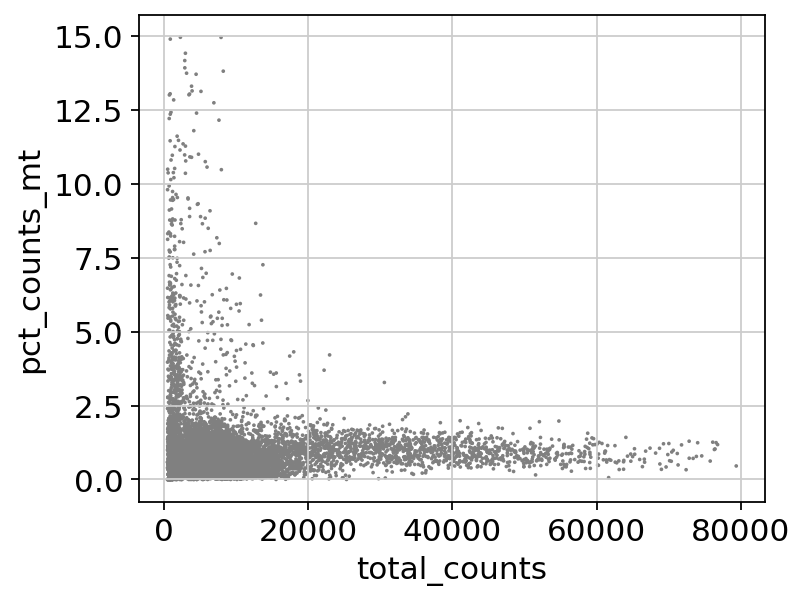

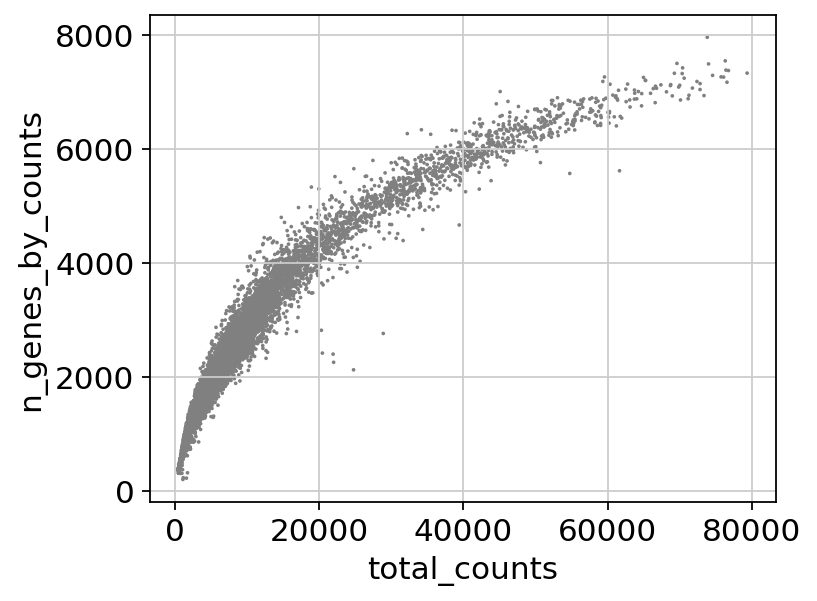

In [20]:
sc.pl.scatter(sample1_data, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(sample1_data, x='total_counts', y='n_genes_by_counts') 

In [21]:
sample1_data.shape

(10853, 12999)

In [22]:
s1_hto = s1_hto[sample1_data.obs_names,:]

## plot raw biotin levels

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_density : Removed 162 rows containing non-finite values.


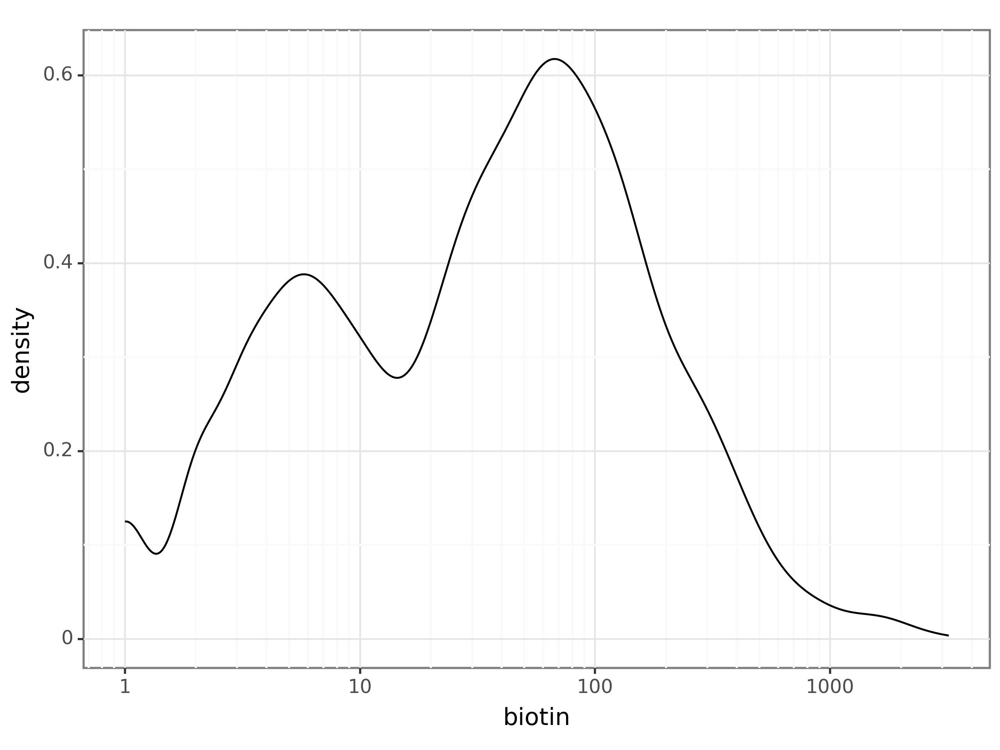

<Figure Size: (1280 x 960)>

In [23]:
ggplot(pd.DataFrame({"biotin": s1_hto[:,"biotin_interaction"].X.toarray().flatten()}), aes(
    x="biotin")) + geom_density()+ theme_bw() + theme(dpi=200) + scale_x_log10()

## plot raw donor levels

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_density : Removed 1431 rows containing non-finite values.


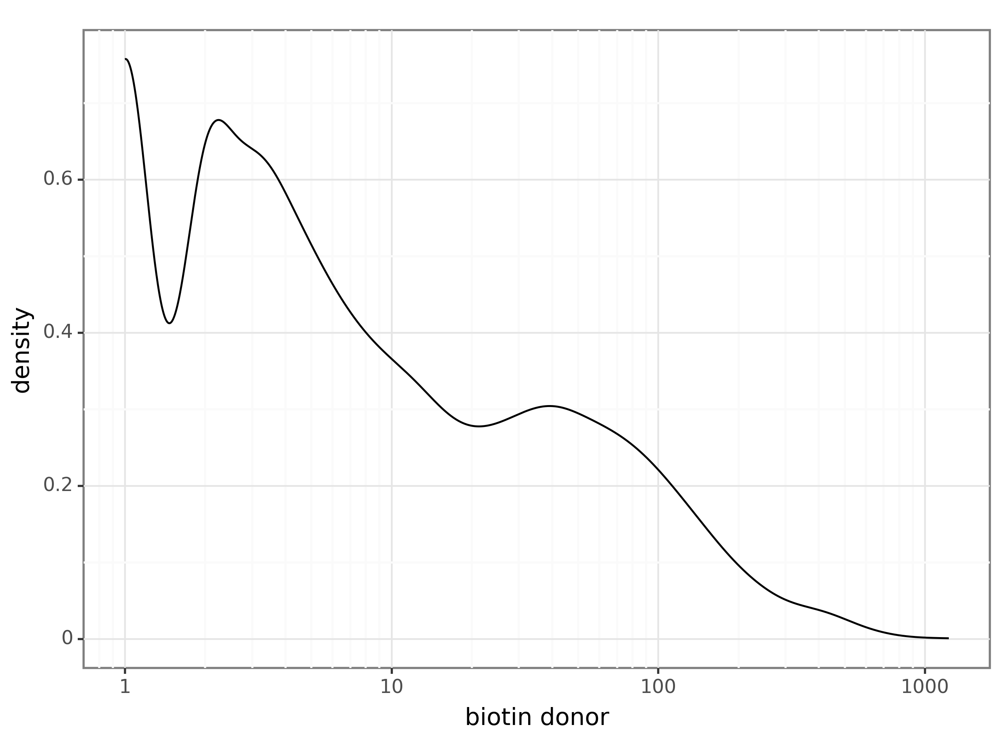

<Figure Size: (1280 x 960)>

In [24]:
ggplot(pd.DataFrame({"biotin donor": s1_hto[:,"donor"].X.toarray().flatten()}), aes(
    x="biotin donor")) + geom_density()+ theme_bw() + theme(dpi=200) + scale_x_log10()

In [26]:
s1_info = pd.DataFrame(s1_hto[:,s1_hto.var_names[~s1_hto.var_names.isin([
    "biotin_interaction", "donor"])]].X.toarray(), index=s1_hto.obs_names, columns = s1_hto.var_names[
    ~s1_hto.var_names.isin(["biotin_interaction", "donor"])])

## assign cells to likely sample

In [27]:
s1_info.head()

,M1_biotin,M1,M4_biotin,M6_biotin,M6,M9_biotin,M11_biotin,M11,M14_biotin,M16_biotin,M16
AAACCTGAGCGAAGGG-1,3.0,4.0,2.0,5.0,0.0,0.0,3.0,6.0,8.0,3835.0,4.0
AAACCTGAGCTGAAAT-1,9.0,12.0,6.0,12.0,5.0,2.0,29.0,45.0,3.0,22.0,12.0
AAACCTGAGTGGGCTA-1,2.0,3.0,0.0,1.0,3.0,6.0,77.0,17.0,1.0,29.0,4.0
AAACCTGCAAATCCGT-1,1.0,5.0,0.0,7.0,2846.0,0.0,9.0,5.0,5.0,8.0,2.0
AAACCTGCAAGTTGTC-1,3.0,2.0,2.0,3.0,2.0,0.0,8.0,4.0,419.0,8.0,1.0


In [28]:
s1_info["likely sample"] = s1_info.T.idxmax()
s1_info.head()

,M1_biotin,M1,M4_biotin,M6_biotin,M6,M9_biotin,M11_biotin,M11,M14_biotin,M16_biotin,M16,likely sample
AAACCTGAGCGAAGGG-1,3.0,4.0,2.0,5.0,0.0,0.0,3.0,6.0,8.0,3835.0,4.0,M16_biotin
AAACCTGAGCTGAAAT-1,9.0,12.0,6.0,12.0,5.0,2.0,29.0,45.0,3.0,22.0,12.0,M11
AAACCTGAGTGGGCTA-1,2.0,3.0,0.0,1.0,3.0,6.0,77.0,17.0,1.0,29.0,4.0,M11_biotin
AAACCTGCAAATCCGT-1,1.0,5.0,0.0,7.0,2846.0,0.0,9.0,5.0,5.0,8.0,2.0,M6
AAACCTGCAAGTTGTC-1,3.0,2.0,2.0,3.0,2.0,0.0,8.0,4.0,419.0,8.0,1.0,M14_biotin


In [29]:
s1_info["sample total"] = np.sum(s1_info.drop(columns = ["likely sample"]), axis = 1)

In [30]:
s1_info.head()

,M1_biotin,M1,M4_biotin,M6_biotin,M6,M9_biotin,M11_biotin,M11,M14_biotin,M16_biotin,M16,likely sample,sample total
AAACCTGAGCGAAGGG-1,3.0,4.0,2.0,5.0,0.0,0.0,3.0,6.0,8.0,3835.0,4.0,M16_biotin,3870.0
AAACCTGAGCTGAAAT-1,9.0,12.0,6.0,12.0,5.0,2.0,29.0,45.0,3.0,22.0,12.0,M11,157.0
AAACCTGAGTGGGCTA-1,2.0,3.0,0.0,1.0,3.0,6.0,77.0,17.0,1.0,29.0,4.0,M11_biotin,143.0
AAACCTGCAAATCCGT-1,1.0,5.0,0.0,7.0,2846.0,0.0,9.0,5.0,5.0,8.0,2.0,M6,2888.0
AAACCTGCAAGTTGTC-1,3.0,2.0,2.0,3.0,2.0,0.0,8.0,4.0,419.0,8.0,1.0,M14_biotin,452.0


In [31]:
s1_info["sample count"] = [row[row["likely sample"]] for _, row in s1_info.iterrows()]

In [32]:
s1_info.head()

,M1_biotin,M1,M4_biotin,M6_biotin,M6,M9_biotin,M11_biotin,M11,M14_biotin,M16_biotin,M16,likely sample,sample total,sample count
AAACCTGAGCGAAGGG-1,3.0,4.0,2.0,5.0,0.0,0.0,3.0,6.0,8.0,3835.0,4.0,M16_biotin,3870.0,3835.0
AAACCTGAGCTGAAAT-1,9.0,12.0,6.0,12.0,5.0,2.0,29.0,45.0,3.0,22.0,12.0,M11,157.0,45.0
AAACCTGAGTGGGCTA-1,2.0,3.0,0.0,1.0,3.0,6.0,77.0,17.0,1.0,29.0,4.0,M11_biotin,143.0,77.0
AAACCTGCAAATCCGT-1,1.0,5.0,0.0,7.0,2846.0,0.0,9.0,5.0,5.0,8.0,2.0,M6,2888.0,2846.0
AAACCTGCAAGTTGTC-1,3.0,2.0,2.0,3.0,2.0,0.0,8.0,4.0,419.0,8.0,1.0,M14_biotin,452.0,419.0


In [33]:
s1_info["sample fraction"] = s1_info["sample count"]/s1_info["sample total"]

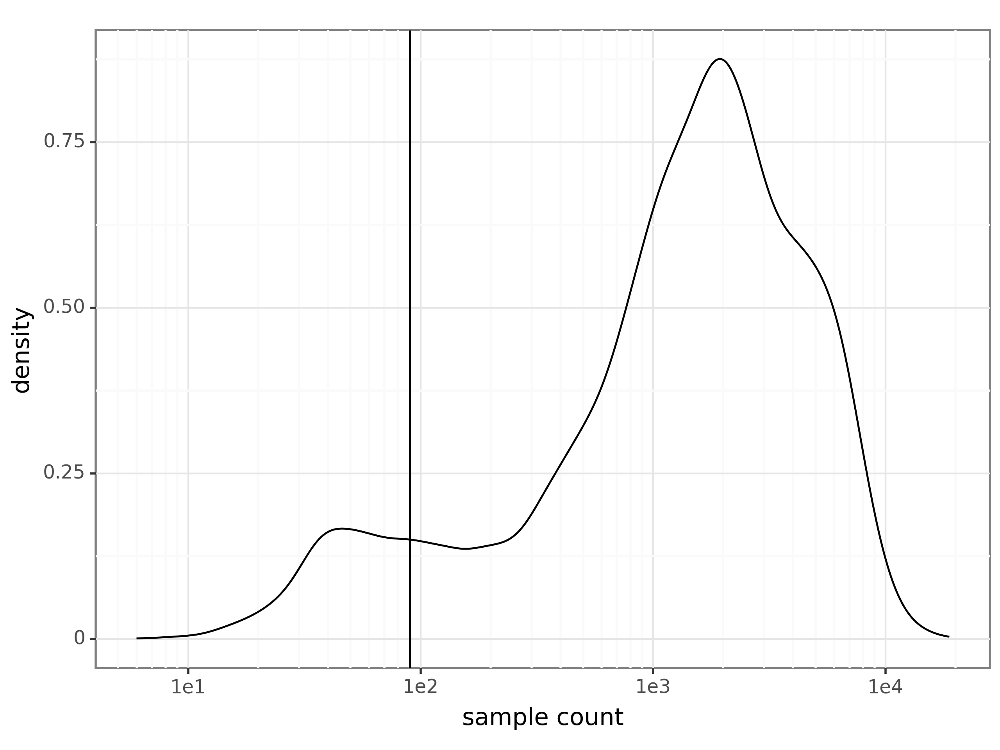

<Figure Size: (1280 x 960)>

In [34]:
ggplot(s1_info, aes(x = "sample count")) + geom_density() + theme_bw() + theme(dpi=200) + geom_vline(
xintercept = 90) + scale_x_log10()

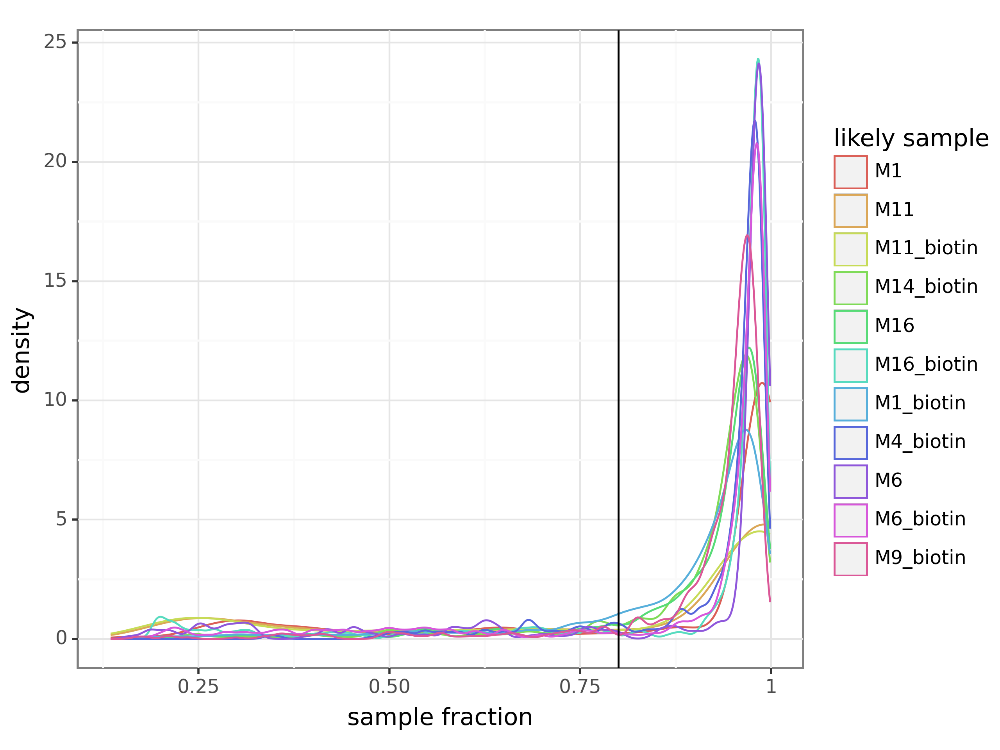

<Figure Size: (1280 x 960)>

In [35]:
ggplot(s1_info, aes(x = "sample fraction", color = "likely sample")) + \
geom_density() + theme_bw() + theme(dpi=200) + geom_vline(xintercept = 0.8)

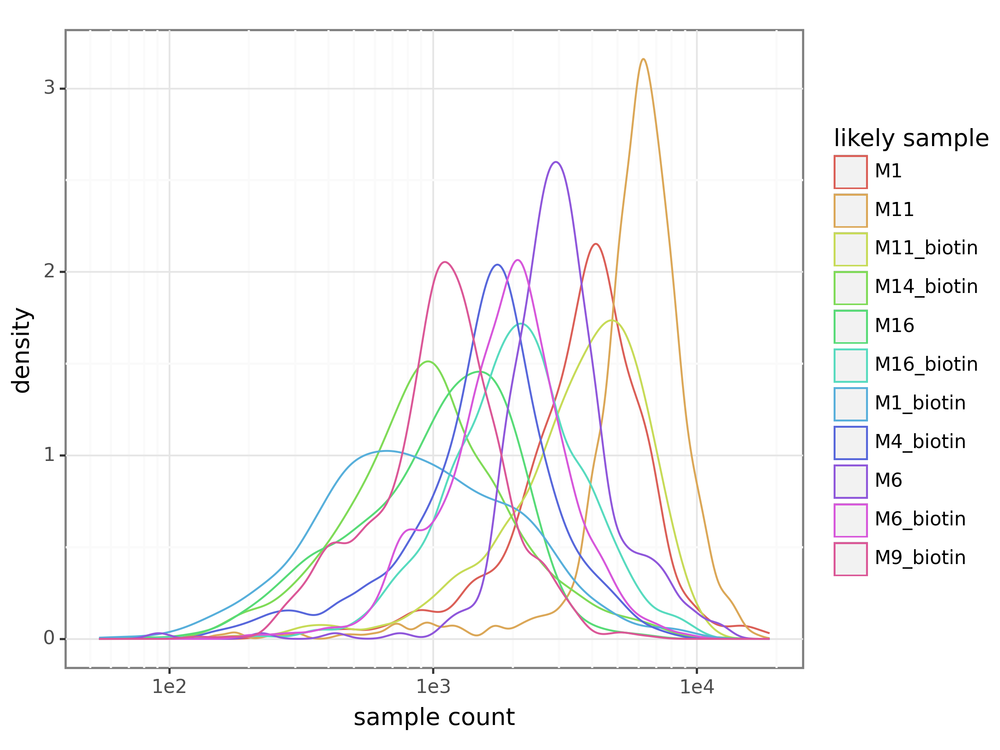

<Figure Size: (1280 x 960)>

In [36]:
ggplot(s1_info[s1_info["sample fraction"] >= 0.8], aes(x = "sample count", color = "likely sample")) + \
geom_density() + theme_bw() + theme(dpi=200) + scale_x_log10() # + geom_vline(xintercept = 90)

## filter out cells if sample HTOs are less than 80% of all (sample) HTOs (excluding biotin, donor levels)

In [37]:
s1_info[s1_info["sample fraction"] >= 0.8].shape

(8685, 15)

In [38]:
## comparing to expected numbers from sort
expected_lane1_counts = pd.DataFrame.from_dict({"M1_biotin": 8000, "M1": 6000, "M4_biotin": 2600, "M6_biotin": 5000,
                                                 "M6": 6000, "M9_biotin": 2400, "M11_biotin": 5000, "M11": 6000,
                                                 "M14_biotin": 3500, "M16_biotin": 5500, "M16": 6000}, 
                                                orient="index").reset_index().rename(columns = {0: "count"})

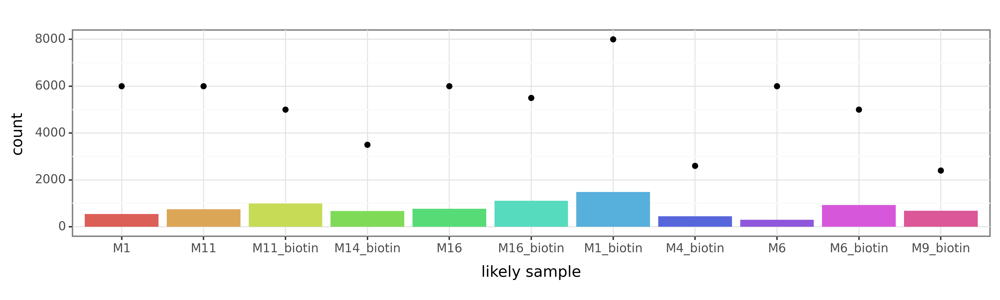

<Figure Size: (2000 x 600)>

In [39]:
ggplot(s1_info[(s1_info["sample fraction"] >= .8)], aes(
    x="likely sample", fill = "likely sample")) + geom_bar() + theme_bw() + theme(
    dpi = 200, legend_position = "none", figure_size=(10, 3)) + geom_point(
aes(x = "index", y="count"), color = "black", data = expected_lane1_counts, inherit_aes = False)

In [40]:
likely_samples = s1_info[(s1_info["sample fraction"] >= 0.8)][["likely sample"]]
likely_samples.head()

,likely sample
AAACCTGAGCGAAGGG-1,M16_biotin
AAACCTGCAAATCCGT-1,M6
AAACCTGCAAGTTGTC-1,M14_biotin
AAACCTGCAATGGAGC-1,M16_biotin
AAACCTGCACCAGTTA-1,M16_biotin


In [41]:
likely_samples.shape

(8685, 1)

In [42]:
## number of cells filtered from low sample fraction
10853-8685

2168

In [43]:
likely_samples["biotin_interaction"] = s1_hto[likely_samples.index, "biotin_interaction"].X.toarray().flatten()

In [44]:
likely_samples["biotin_donor"] = s1_hto[likely_samples.index, "donor"].X.toarray().flatten()

In [45]:
likely_samples.head()

,likely sample,biotin_interaction,biotin_donor
AAACCTGAGCGAAGGG-1,M16_biotin,70.0,24.0
AAACCTGCAAATCCGT-1,M6,2.0,2.0
AAACCTGCAAGTTGTC-1,M14_biotin,84.0,8.0
AAACCTGCAATGGAGC-1,M16_biotin,22.0,1.0
AAACCTGCACCAGTTA-1,M16_biotin,40.0,3.0


In [46]:
likely_samples["biotin sample"] = likely_samples["likely sample"].str.contains("biotin")
likely_samples["biotin sample"]

AAACCTGAGCGAAGGG-1     True
AAACCTGCAAATCCGT-1    False
AAACCTGCAAGTTGTC-1     True
AAACCTGCAATGGAGC-1     True
AAACCTGCACCAGTTA-1     True
                      ...  
TTTGTCAGTTTGCATG-1     True
TTTGTCATCGCGGATC-1     True
TTTGTCATCGGCGCTA-1     True
TTTGTCATCGGTCTAA-1     True
TTTGTCATCTTCTGGC-1    False
Name: biotin sample, Length: 8685, dtype: bool

In [47]:
likely_samples.shape

(8685, 4)

## compare biotin levels for cells that were sorted as biotin + vs background population

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_density : Removed 133 rows containing non-finite values.


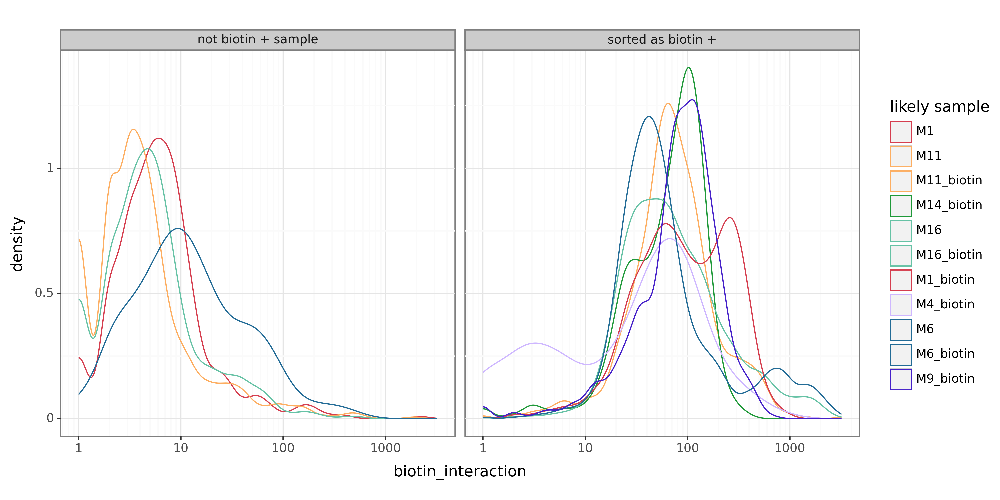

<Figure Size: (2000 x 1000)>

In [48]:
lab = lambda x: "sorted as biotin +" if x == "True" else "not biotin + sample"
ggplot(likely_samples.rename(columns = {"biotin sample": "biotin_sample"}), aes(
    x = "biotin_interaction", color = "likely sample")) + geom_density() + theme_bw() + theme(
    dpi=200, figure_size=(10, 5)) + scale_x_log10() + facet_wrap("~ biotin_sample", labeller = lab) + \
scale_color_manual(["#d53e4f", # M1
                    "#fdae61", "#fdae61", # M11
                    "#1f9939", # M14
                    "#66c2a5", "#66c2a5", # M16
                    "#d53e4f", # M1
                    "#ceb7ff",# M4
                    "#226b96", "#226b96",# M6
                    "#4520c9"# M9
])

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_density : Removed 133 rows containing non-finite values.


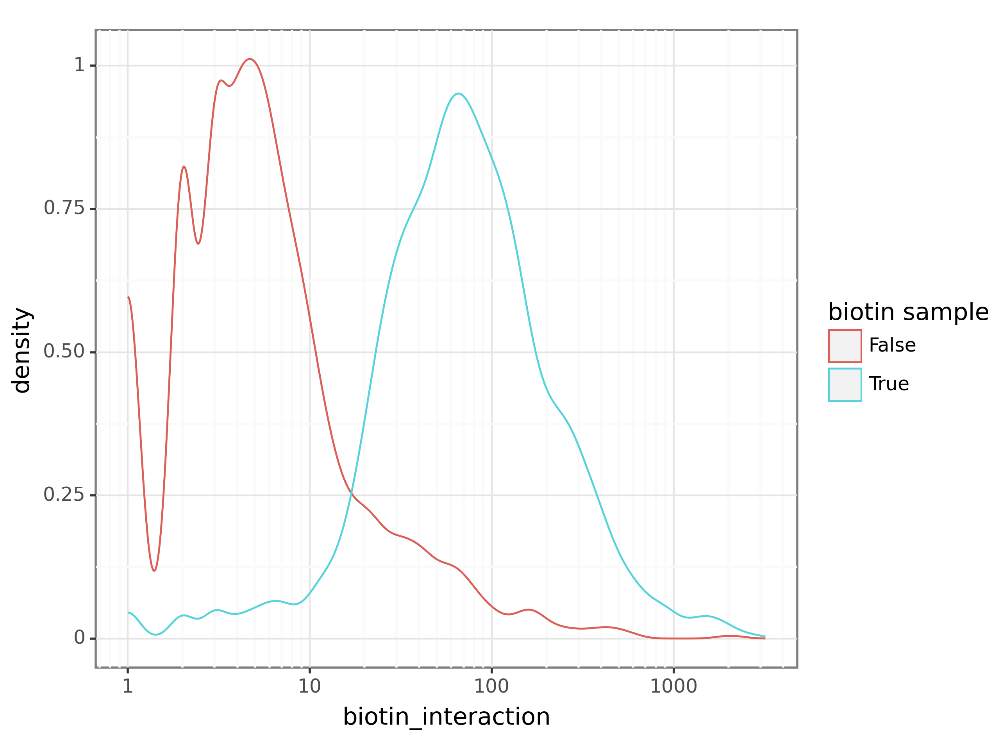

<Figure Size: (1280 x 960)>

In [49]:
ggplot(likely_samples, aes(x = "biotin_interaction", color = "biotin sample")) + geom_density() + theme_bw() + theme(
    dpi=200) + scale_x_log10()

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_density : Removed 1211 rows containing non-finite values.


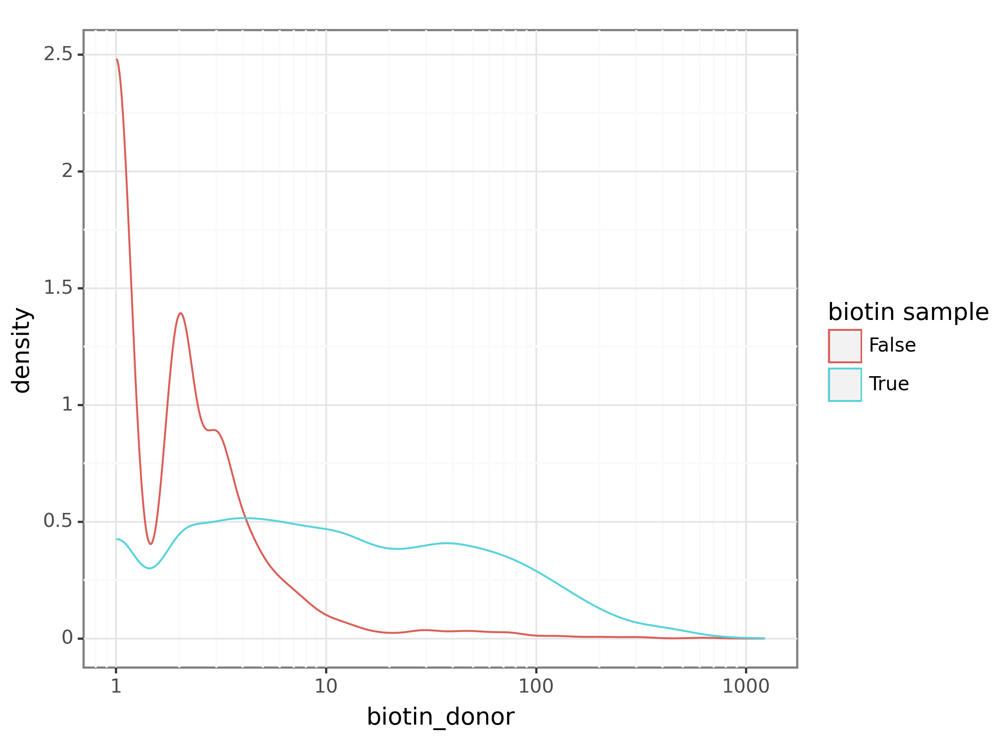

<Figure Size: (1280 x 960)>

In [50]:
ggplot(likely_samples, aes(x = "biotin_donor", color = "biotin sample")) + geom_density() + theme_bw() + theme(
    dpi=200) + scale_x_log10()

In [51]:
sample1_data = sample1_data[likely_samples.index,:]
sample1_data.obs = sample1_data.obs.merge(likely_samples, left_index = True, right_index = True)
sample1_data.obs = sample1_data.obs.merge(s1_info[["sample count", "sample fraction"]], left_index = True, right_index = True)

In [52]:
sample1_data.obs = sample1_data.obs.merge(s1_info[[]], left_index = True, right_index = True)

In [53]:
sample1_data.obs

,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,n_genes,likely sample,biotin_interaction,biotin_donor,biotin sample,sample count,sample fraction
AAACCTGAGCGAAGGG-1,2463,7152.0,30.0,0.419463,2456,M16_biotin,70.0,24.0,True,3835.0,0.990956
AAACCTGCAAATCCGT-1,2227,6617.0,104.0,1.571709,2224,M6,2.0,2.0,False,2846.0,0.985457
AAACCTGCAAGTTGTC-1,2088,7118.0,79.0,1.109862,2084,M14_biotin,84.0,8.0,True,419.0,0.926991
AAACCTGCAATGGAGC-1,3868,17145.0,294.0,1.714786,3857,M16_biotin,22.0,1.0,True,1020.0,0.952381
AAACCTGCACCAGTTA-1,1779,4811.0,54.0,1.122428,1775,M16_biotin,40.0,3.0,True,1127.0,0.975758
...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCAGTTTGCATG-1,2069,6378.0,36.0,0.564440,2065,M14_biotin,103.0,25.0,True,554.0,0.921797
TTTGTCATCGCGGATC-1,3300,10774.0,134.0,1.243735,3292,M6_biotin,67.0,2.0,True,2953.0,0.984662
TTTGTCATCGGCGCTA-1,2484,8775.0,66.0,0.752137,2482,M14_biotin,109.0,43.0,True,629.0,0.945865
TTTGTCATCGGTCTAA-1,6416,47726.0,545.0,1.141935,6376,M1_biotin,805.0,162.0,True,706.0,0.941333


In [54]:
sample1_data.obs["cell_norm_biotin"] = sample1_data.obs["biotin_interaction"]/sample1_data.obs["sample count"]

In [55]:
sample1_data.obs["cell_norm_donor"] = sample1_data.obs["biotin_donor"]/sample1_data.obs["sample count"]

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_density : Removed 133 rows containing non-finite values.


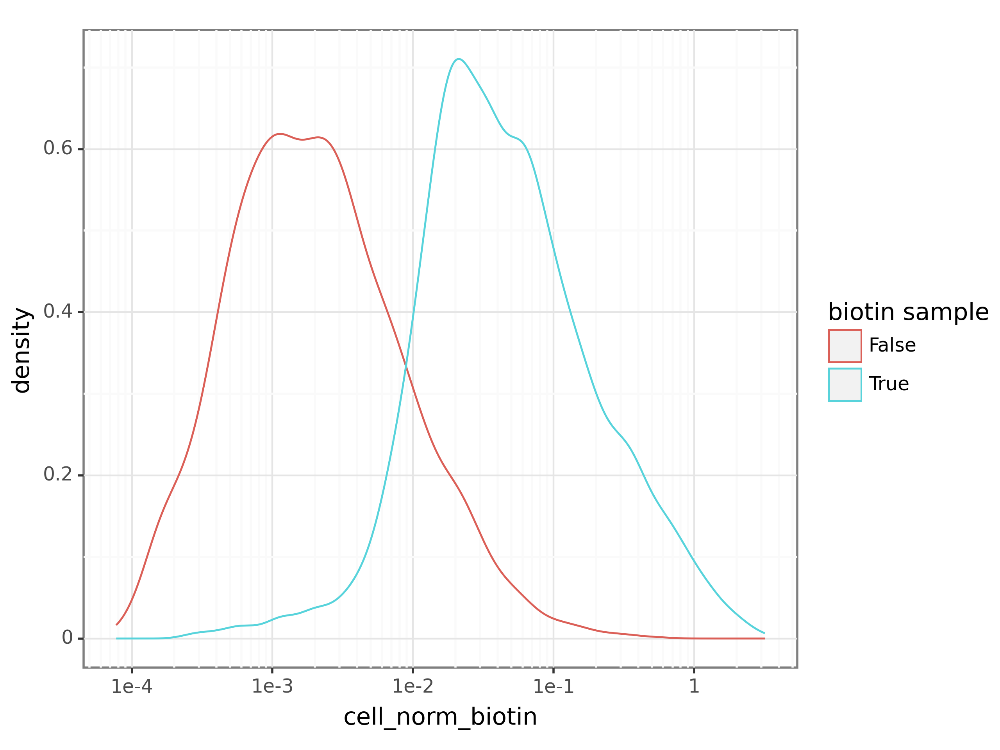

<Figure Size: (1280 x 960)>

In [56]:
ggplot(sample1_data.obs, aes(x = "cell_norm_biotin", color = "biotin sample")) + geom_density() + theme_bw() + theme(
    dpi=200) + scale_x_log10()

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_density : Removed 1211 rows containing non-finite values.


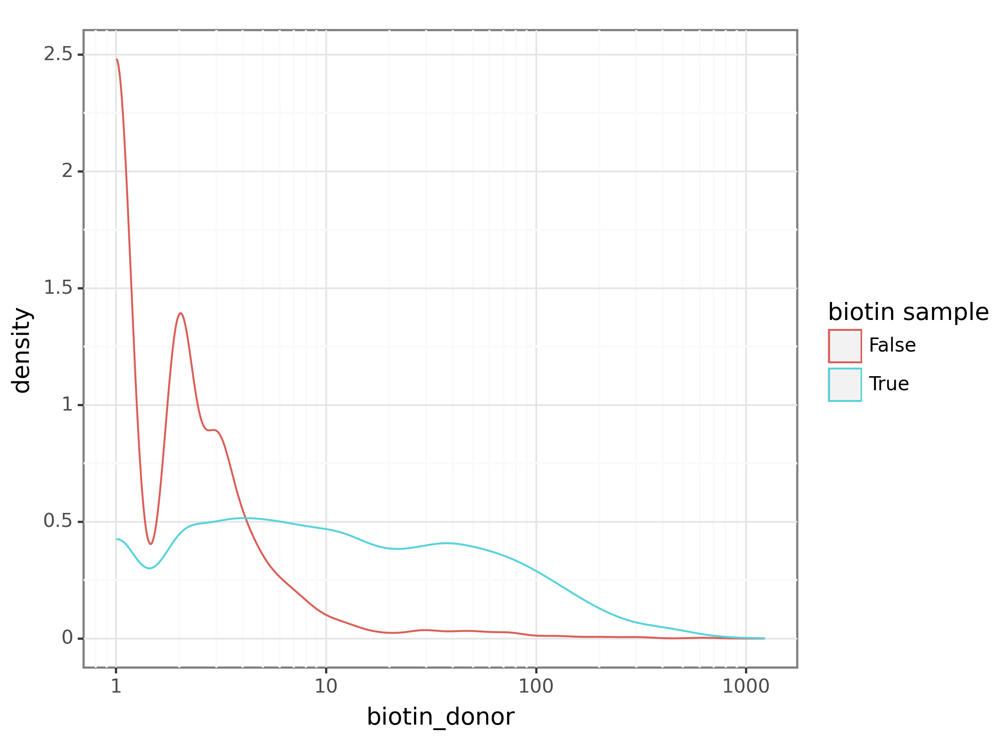

<Figure Size: (1280 x 960)>

In [57]:
ggplot(sample1_data.obs, aes(x = "biotin_donor", color = "biotin sample")) + geom_density() + theme_bw() + theme(
    dpi=200) + scale_x_log10()

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_density : Removed 1211 rows containing non-finite values.


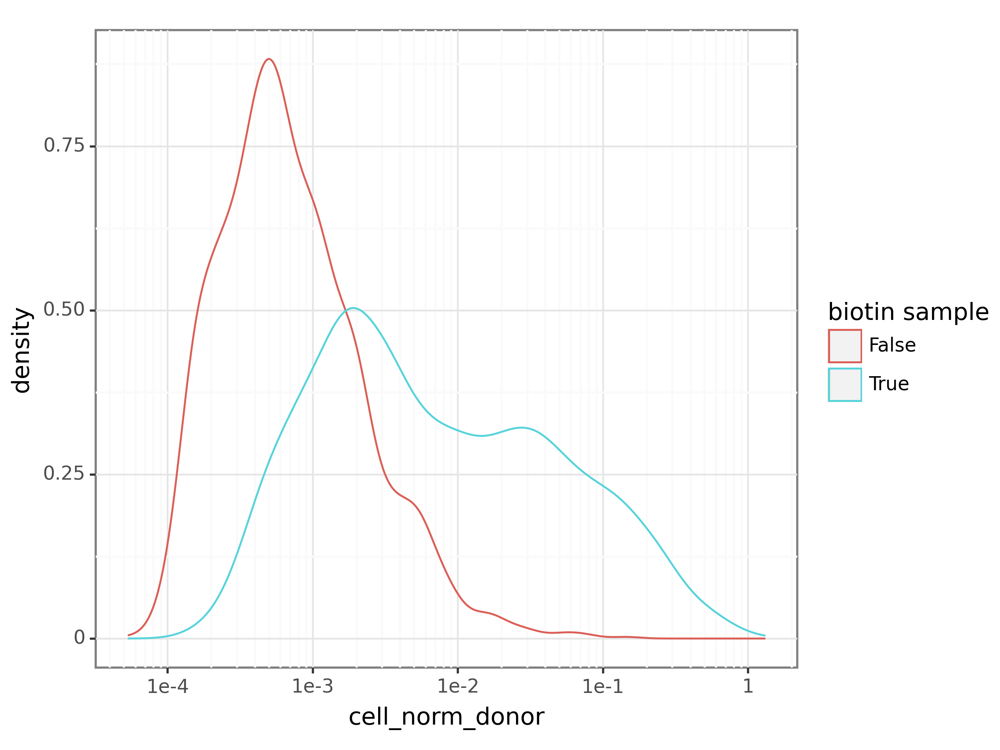

<Figure Size: (1280 x 960)>

In [58]:
ggplot(sample1_data.obs, aes(x = "cell_norm_donor", color = "biotin sample")) + geom_density() + theme_bw() + theme(
    dpi=200) + scale_x_log10()

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_density : Removed 1211 rows containing non-finite values.


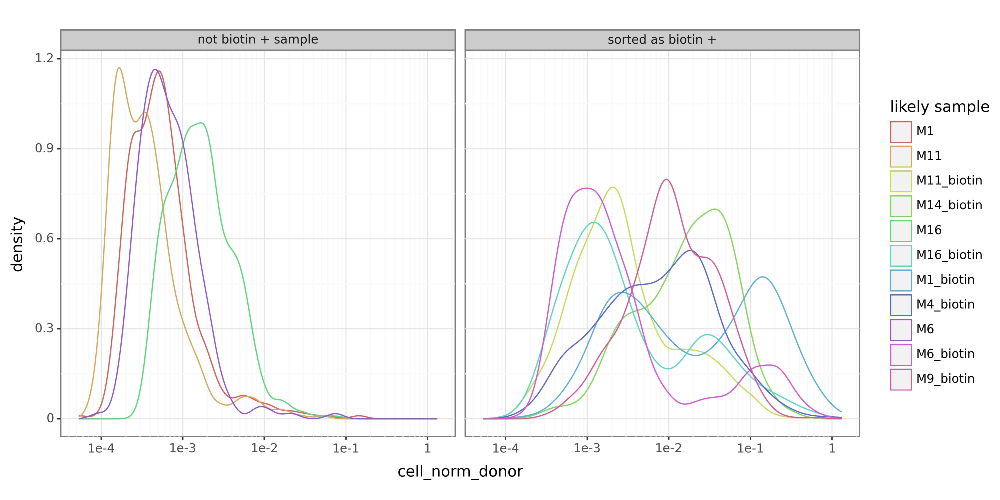

<Figure Size: (2000 x 1000)>

In [59]:
ggplot(sample1_data.obs.rename(columns = {"biotin sample": "biotin_sample"}), aes(
    x = "cell_norm_donor", color = "likely sample")) + geom_density() + theme_bw() + theme(
    dpi=200, figure_size=(10, 5)) + scale_x_log10() + facet_wrap("~ biotin_sample", labeller = lab)

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_density : Removed 133 rows containing non-finite values.


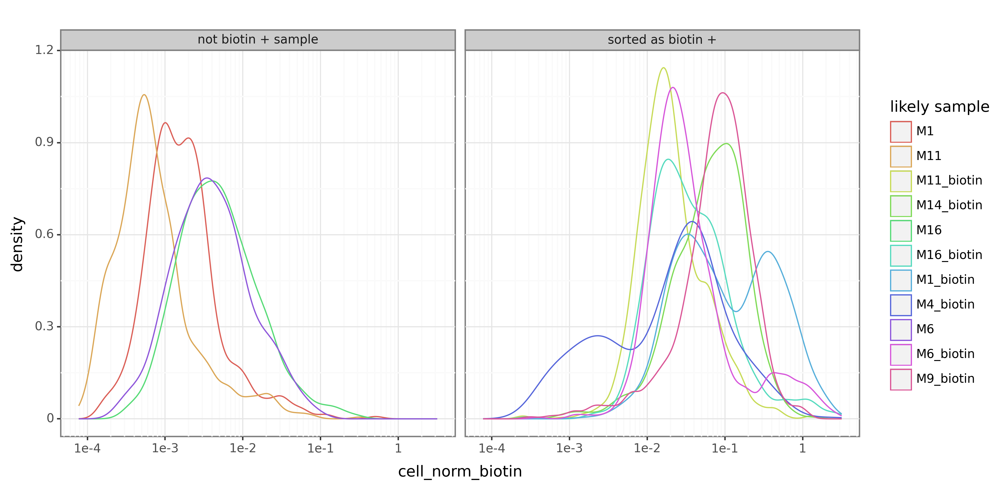

<Figure Size: (2000 x 1000)>

In [60]:
ggplot(sample1_data.obs.rename(columns = {"biotin sample": "biotin_sample"}), aes(
    x = "cell_norm_biotin", color = "likely sample")) + geom_density() + theme_bw() + theme(
    dpi=200, figure_size=(10, 5)) + scale_x_log10() + facet_wrap("~ biotin_sample", labeller = lab)

In [61]:
sample1_data.var

,gene_ids,feature_types,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_counts
Mrpl15,ENSMUSG00000033845,Gene Expression,False,4601,1.108054,58.361991,12244.0,12198.0
Lypla1,ENSMUSG00000025903,Gene Expression,False,3793,0.630317,65.674208,6965.0,6945.0
Tcea1,ENSMUSG00000033813,Gene Expression,False,6488,1.697828,41.285068,18761.0,18730.0
Atp6v1h,ENSMUSG00000033793,Gene Expression,False,3752,0.573122,66.045249,6333.0,6320.0
Rb1cc1,ENSMUSG00000025907,Gene Expression,False,3773,0.512398,65.855204,5662.0,5652.0
...,...,...,...,...,...,...,...,...
Vamp7,ENSMUSG00000051412,Gene Expression,False,1663,0.206606,84.950226,2283.0,2277.0
Tmlhe,ENSMUSG00000079834,Gene Expression,False,904,0.097285,91.819005,1075.0,1074.0
CR974586.4,ENSMUSG00000096506,Gene Expression,False,24,0.005701,99.782805,63.0,63.0
CAAA01147332.1,ENSMUSG00000095742,Gene Expression,False,3510,1.425430,68.235294,15751.0,15727.0


## now normalized GEX values with Pearson residual normalization

In [62]:
def determine_theta(ad, thetas = [0.1, 1, 10, 100, 1000]):
    gene_means = pd.DataFrame()
    for theta in thetas: ## try different values for theta
        ad.X = ad.layers["raw_counts"].copy()
        sc.experimental.pp.normalize_pearson_residuals(ad, theta = theta, inplace = True)
        lay = "theta_"+ str(round(theta, 1))
        ad.layers[lay] = ad.X.copy()
        gene_means = gene_means.append(pd.DataFrame({"gene_means": np.mean(ad.layers[lay], axis = 0),
                                                     "gene_vars": np.var(ad.layers[lay], axis = 0), "theta": theta}))
    gene_means = gene_means.melt(ignore_index=False, value_vars = ["gene_means", "gene_vars"], id_vars = "theta", 
                    var_name = "stat", value_name = "value")
    print(gene_means.head())
    print(ggplot(gene_means[gene_means.value <= 10], aes(x="value", fill="stat")) + 
          geom_histogram(bins = 150) + theme(dpi=200) + \
          facet_grid("theta ~ stat", scales = "free_x") + geom_vline(pd.DataFrame(
        {"stat": ["gene_means", "gene_vars"], "x": [0, 1]}), aes(xintercept="x"), color="black"))    

In [63]:
sample1_data.layers["raw_counts"] = sample1_data.X.copy()

/tmp/ipykernel_293954/3406612910.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/tmp/ipykernel_293954/3406612910.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/tmp/ipykernel_293954/3406612910.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/tmp/ipykernel_293954/3406612910.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


   theta        stat     value
0    0.1  gene_means -0.070259
1    0.1  gene_means -0.030489
2    0.1  gene_means -0.018259
3    0.1  gene_means  0.000054
4    0.1  gene_means  0.078772


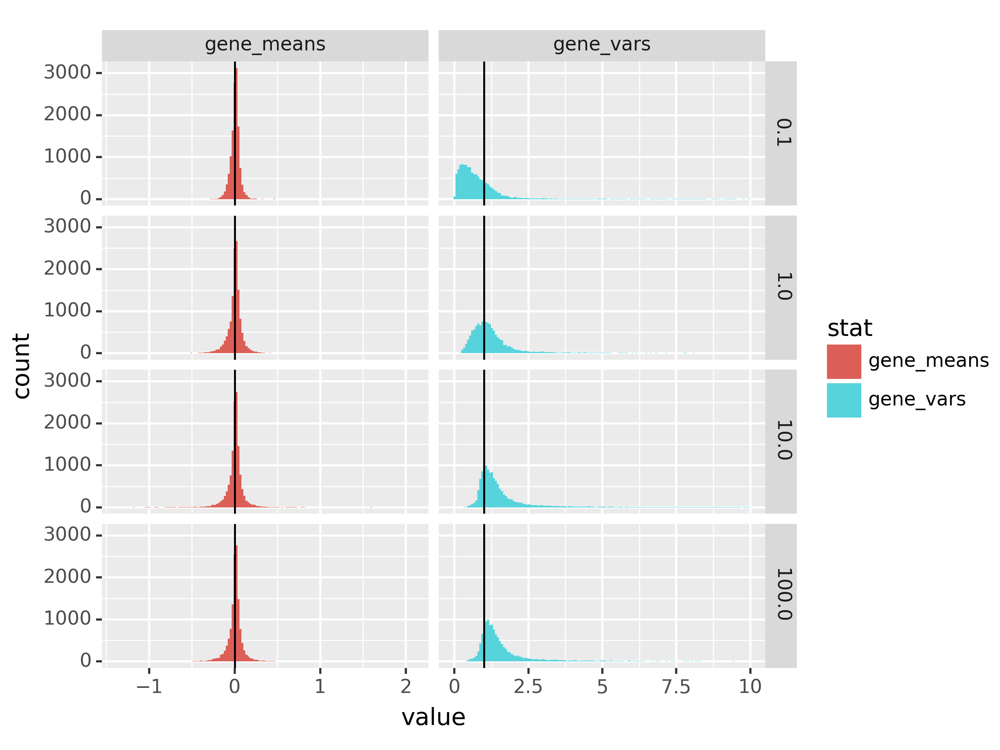

In [64]:
determine_theta(sample1_data, thetas = [0.1, 1, 10, 100])

## pick theta 1: gene vars centered around 1

In [65]:
sample1_data.X = sample1_data.layers["theta_1"].copy()
for lay in ["theta_0.1", "theta_10", "theta_100"]:
    del sample1_data.layers[lay]
sample1_data.layers

Layers with keys: raw_counts, theta_1

In [67]:
sample1_data.write_h5ad("lcmv_SNH1_.h5ad")

## now with sample 3

In [68]:
sample3_data = sc.read_10x_mtx("/Genomics/pritykinlab/share/uLIPSTIC/data/lcmv_v2/SNH3/outs/filtered_feature_bc_matrix/",
                               gex_only = False)

In [69]:
sample3_data.var

,gene_ids,feature_types
Xkr4,ENSMUSG00000051951,Gene Expression
Gm1992,ENSMUSG00000089699,Gene Expression
Gm19938,ENSMUSG00000102331,Gene Expression
Gm37381,ENSMUSG00000102343,Gene Expression
Rp1,ENSMUSG00000025900,Gene Expression
...,...,...
Li4_biotin,3,Custom
Li5_biotin,4,Custom
Lu5_biotin,5,Custom
biotin_interaction,C0436,Custom


In [70]:
s3_hto_info = sample3_data[:, sample3_data.var_names[sample3_data.var.feature_types == "Custom"]]
s3_hto_info.shape 

(12572, 17)

In [71]:
sample3_data = sample3_data[:,sample3_data.var_names[sample3_data.var.feature_types != "Custom"]]

In [72]:
sample3_data.shape

(12572, 32285)

In [73]:
sample3_data.var['mt'] = sample3_data.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(sample3_data, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

/tmp/ipykernel_293954/906831841.py:1: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.


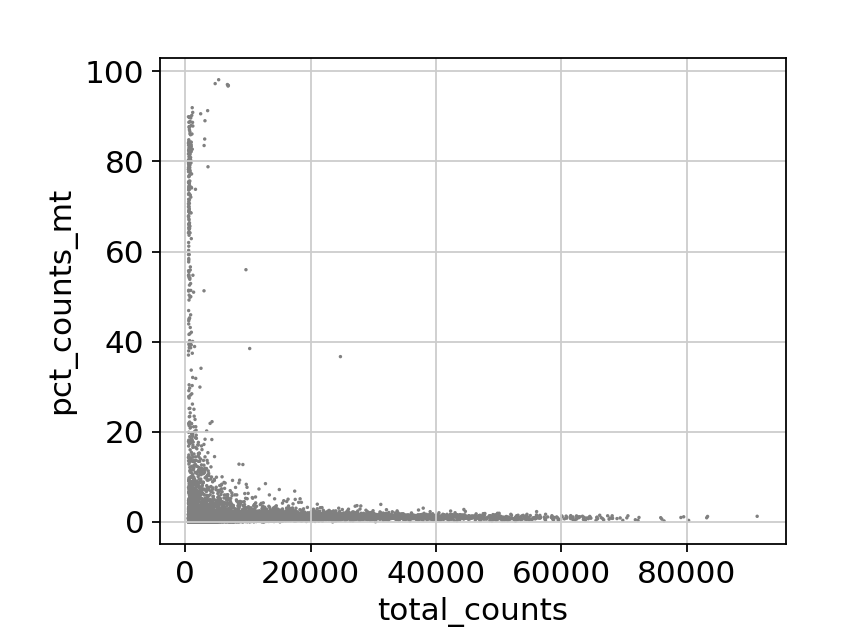

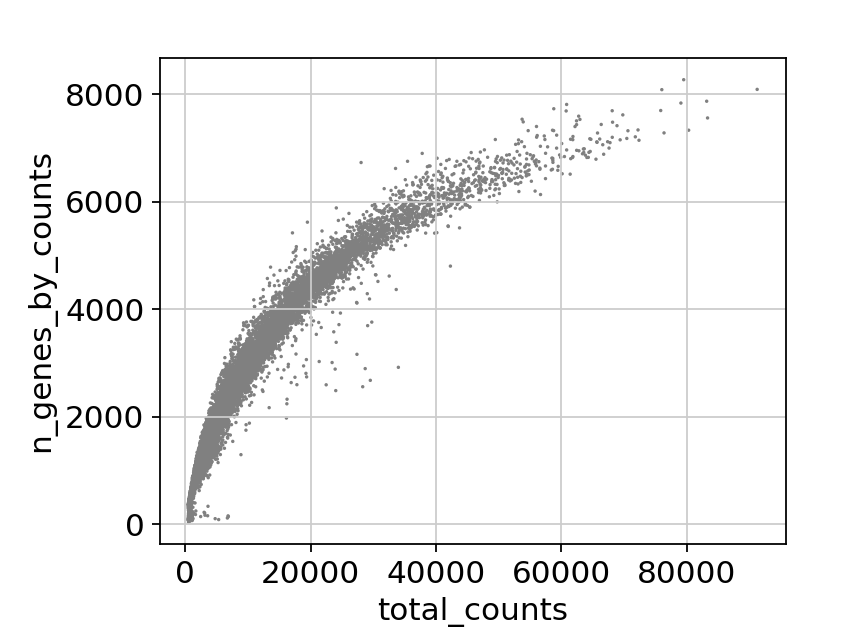

In [74]:
sc.pl.scatter(sample3_data, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(sample3_data, x='total_counts', y='n_genes_by_counts') 

In [75]:
sample3_data.shape

(12572, 32285)

## filter by high mitochondria

In [76]:
sample3_data = sample3_data[sample3_data.obs["pct_counts_mt"] <= 15]

In [77]:
sample3_data.shape

(12278, 32285)

In [78]:
12572-12278

294

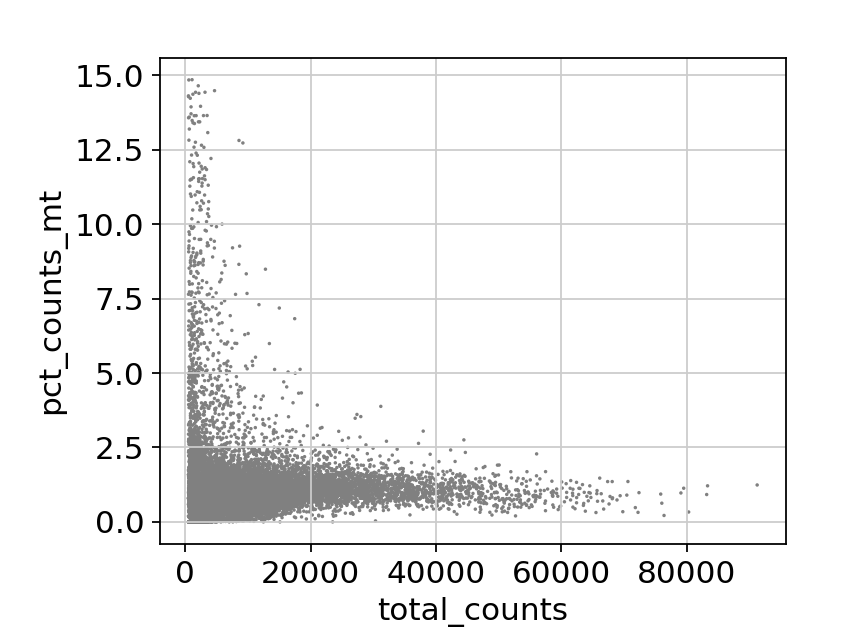

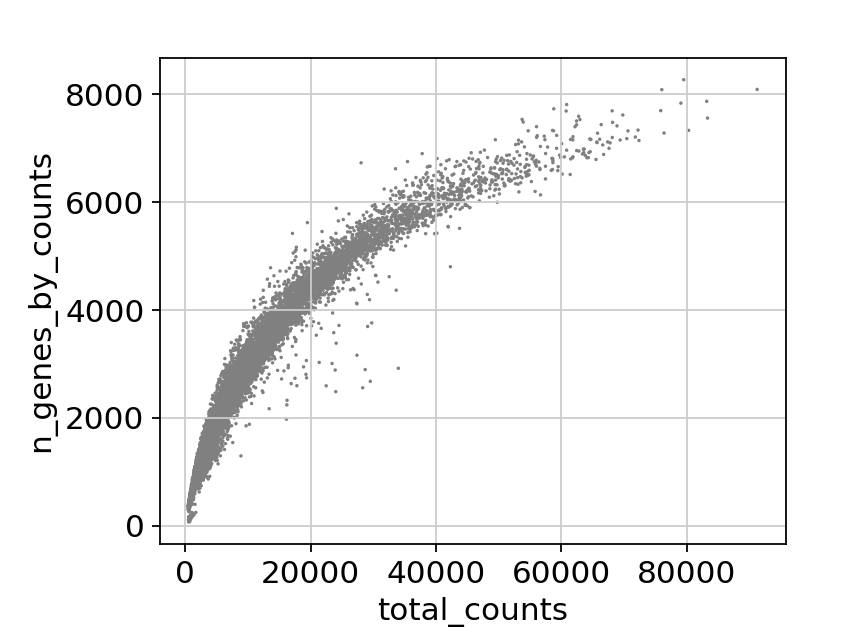

In [79]:
sc.pl.scatter(sample3_data, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(sample3_data, x='total_counts', y='n_genes_by_counts') 

## filter by high total counts

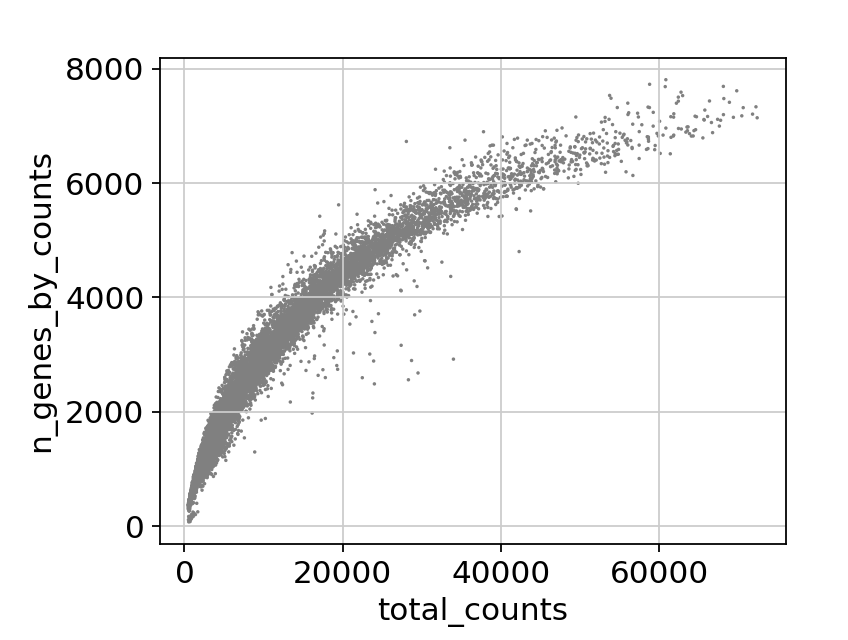

In [80]:
sample3_data = sample3_data[sample3_data.obs["total_counts"] <= 75000]
sc.pl.scatter(sample3_data, x='total_counts', y='n_genes_by_counts') 

In [81]:
sample3_data.shape

(12269, 32285)

In [82]:
12278-12269

9

## filter by low gene / cell counts

In [83]:
sc.pp.filter_genes(sample3_data, 0.005*sample3_data.shape[0])
sc.pp.filter_cells(sample3_data, min_genes = 200)

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:248: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.


In [85]:
sample3_data.shape

(12249, 13868)

In [86]:
12269-12249

20

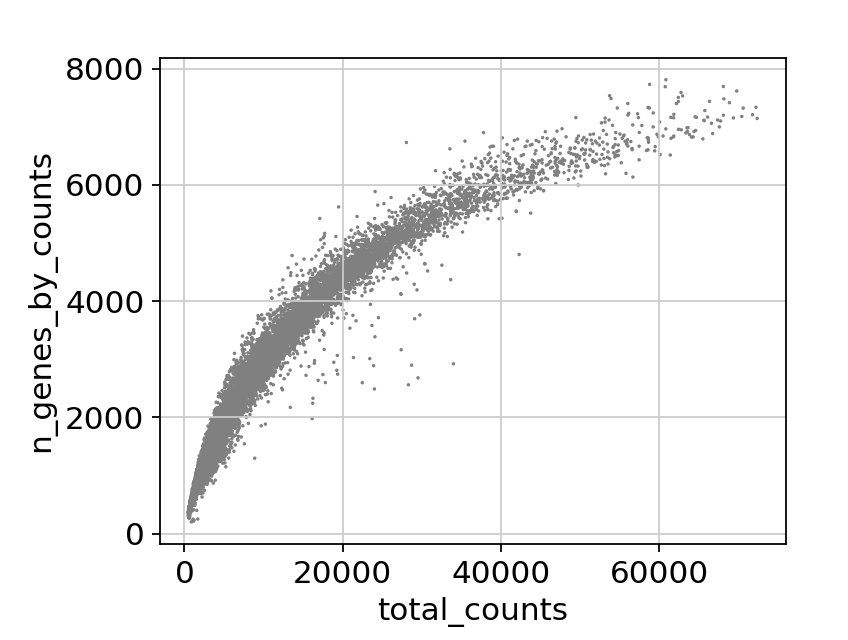

In [87]:
sc.pl.scatter(sample3_data, x='total_counts', y='n_genes_by_counts') 

In [88]:
s3_hto_info = s3_hto_info[sample3_data.obs_names,:]
s3_hto_info.shape

(12249, 17)

In [89]:
s3_hto_info.obs.head()

""
AAACCTGAGACAAGCC-1
AAACCTGAGCCAGTAG-1
AAACCTGAGCGTTTAC-1
AAACCTGAGGAGTACC-1
AAACCTGAGGCGTACA-1


## plot raw biotin levels

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_density : Removed 10 rows containing non-finite values.


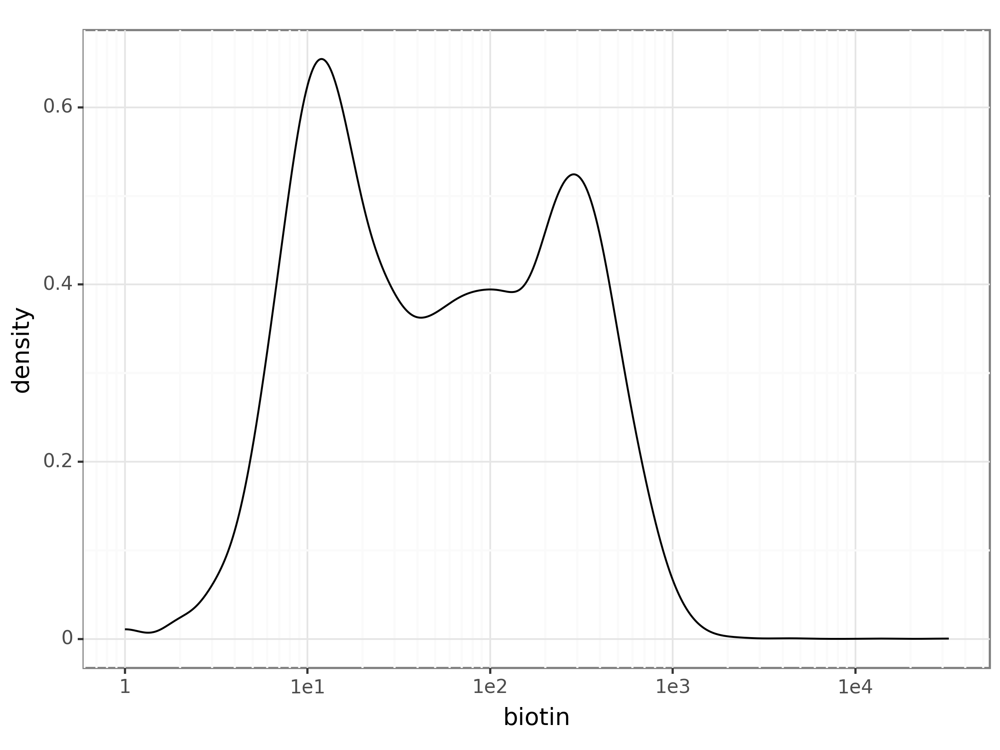

<Figure Size: (1280 x 960)>

In [90]:
ggplot(pd.DataFrame({"biotin": s3_hto_info[:,"biotin_interaction"].X.toarray().flatten()}), aes(
    x="biotin")) + geom_density()+ theme_bw() + theme(dpi=200) + scale_x_log10()

## plot raw donor levels

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_density : Removed 29 rows containing non-finite values.


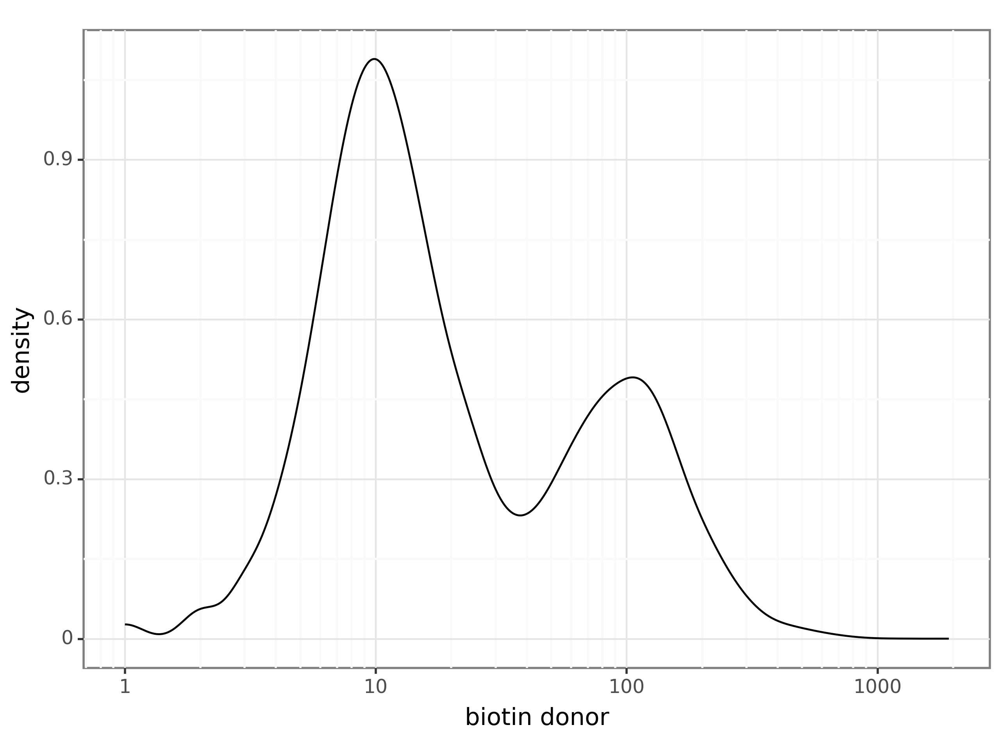

<Figure Size: (1280 x 960)>

In [91]:
ggplot(pd.DataFrame({"biotin donor": s3_hto_info[:,"donor"].X.toarray().flatten()}), aes(
    x="biotin donor")) + geom_density()+ theme_bw() + theme(dpi=200) + scale_x_log10()

## assign cells to likely sample

In [92]:
sample3_info = pd.DataFrame(s3_hto_info[:,s3_hto_info.var_names[~s3_hto_info.var_names.isin(
    ["biotin_interaction", "donor"])]].X.toarray(), index = s3_hto_info.obs_names, columns = 
                                        s3_hto_info.var_names[~s3_hto_info.var_names.isin(
                                            ["biotin_interaction", "donor"])])

In [93]:
sample3_info.head()

,M3_biotin,M3,M8_biotin,M8,M13_biotin,M13A,Li1_biotin,Li1,Li2_biotin,Li2,Li3_biotin,Li3,Li4_biotin,Li5_biotin,Lu5_biotin
AAACCTGAGACAAGCC-1,3.0,6.0,2.0,4371.0,4.0,2.0,6.0,2.0,15.0,1.0,8.0,4.0,1.0,2.0,2.0
AAACCTGAGCCAGTAG-1,154.0,5.0,13.0,11.0,4.0,0.0,8.0,4.0,5.0,2.0,10.0,4.0,4.0,3.0,2.0
AAACCTGAGCGTTTAC-1,72.0,4.0,2.0,7.0,3.0,3.0,7.0,478.0,4.0,1.0,5.0,3.0,0.0,163.0,1.0
AAACCTGAGGAGTACC-1,6.0,44.0,8.0,8.0,4.0,4.0,15.0,2.0,11.0,1719.0,8343.0,3.0,8.0,6.0,5.0
AAACCTGAGGCGTACA-1,9.0,5.0,1802.0,18.0,12.0,0.0,6.0,4.0,8.0,2.0,9.0,12.0,3.0,5.0,5.0


In [94]:
sample3_info["likely sample"] = sample3_info.T.idxmax()
sample3_info.head()

,M3_biotin,M3,M8_biotin,M8,M13_biotin,M13A,Li1_biotin,Li1,Li2_biotin,Li2,Li3_biotin,Li3,Li4_biotin,Li5_biotin,Lu5_biotin,likely sample
AAACCTGAGACAAGCC-1,3.0,6.0,2.0,4371.0,4.0,2.0,6.0,2.0,15.0,1.0,8.0,4.0,1.0,2.0,2.0,M8
AAACCTGAGCCAGTAG-1,154.0,5.0,13.0,11.0,4.0,0.0,8.0,4.0,5.0,2.0,10.0,4.0,4.0,3.0,2.0,M3_biotin
AAACCTGAGCGTTTAC-1,72.0,4.0,2.0,7.0,3.0,3.0,7.0,478.0,4.0,1.0,5.0,3.0,0.0,163.0,1.0,Li1
AAACCTGAGGAGTACC-1,6.0,44.0,8.0,8.0,4.0,4.0,15.0,2.0,11.0,1719.0,8343.0,3.0,8.0,6.0,5.0,Li3_biotin
AAACCTGAGGCGTACA-1,9.0,5.0,1802.0,18.0,12.0,0.0,6.0,4.0,8.0,2.0,9.0,12.0,3.0,5.0,5.0,M8_biotin


In [95]:
sample3_info["sample count"] = [row[row["likely sample"]] for _, row in sample3_info.iterrows()]

In [96]:
sample3_info.head()

,M3_biotin,M3,M8_biotin,M8,M13_biotin,M13A,Li1_biotin,Li1,Li2_biotin,Li2,Li3_biotin,Li3,Li4_biotin,Li5_biotin,Lu5_biotin,likely sample,sample count
AAACCTGAGACAAGCC-1,3.0,6.0,2.0,4371.0,4.0,2.0,6.0,2.0,15.0,1.0,8.0,4.0,1.0,2.0,2.0,M8,4371.0
AAACCTGAGCCAGTAG-1,154.0,5.0,13.0,11.0,4.0,0.0,8.0,4.0,5.0,2.0,10.0,4.0,4.0,3.0,2.0,M3_biotin,154.0
AAACCTGAGCGTTTAC-1,72.0,4.0,2.0,7.0,3.0,3.0,7.0,478.0,4.0,1.0,5.0,3.0,0.0,163.0,1.0,Li1,478.0
AAACCTGAGGAGTACC-1,6.0,44.0,8.0,8.0,4.0,4.0,15.0,2.0,11.0,1719.0,8343.0,3.0,8.0,6.0,5.0,Li3_biotin,8343.0
AAACCTGAGGCGTACA-1,9.0,5.0,1802.0,18.0,12.0,0.0,6.0,4.0,8.0,2.0,9.0,12.0,3.0,5.0,5.0,M8_biotin,1802.0


In [97]:
sample3_info["total count"] = sample3_info.drop(columns = ["likely sample", "sample count"]).sum(axis = 1)

In [98]:
sample3_info.head()

,M3_biotin,M3,M8_biotin,M8,M13_biotin,M13A,Li1_biotin,Li1,Li2_biotin,Li2,Li3_biotin,Li3,Li4_biotin,Li5_biotin,Lu5_biotin,likely sample,sample count,total count
AAACCTGAGACAAGCC-1,3.0,6.0,2.0,4371.0,4.0,2.0,6.0,2.0,15.0,1.0,8.0,4.0,1.0,2.0,2.0,M8,4371.0,4429.0
AAACCTGAGCCAGTAG-1,154.0,5.0,13.0,11.0,4.0,0.0,8.0,4.0,5.0,2.0,10.0,4.0,4.0,3.0,2.0,M3_biotin,154.0,229.0
AAACCTGAGCGTTTAC-1,72.0,4.0,2.0,7.0,3.0,3.0,7.0,478.0,4.0,1.0,5.0,3.0,0.0,163.0,1.0,Li1,478.0,753.0
AAACCTGAGGAGTACC-1,6.0,44.0,8.0,8.0,4.0,4.0,15.0,2.0,11.0,1719.0,8343.0,3.0,8.0,6.0,5.0,Li3_biotin,8343.0,10186.0
AAACCTGAGGCGTACA-1,9.0,5.0,1802.0,18.0,12.0,0.0,6.0,4.0,8.0,2.0,9.0,12.0,3.0,5.0,5.0,M8_biotin,1802.0,1900.0


In [99]:
sample3_info["sample fraction"] = sample3_info["sample count"]/sample3_info["total count"]

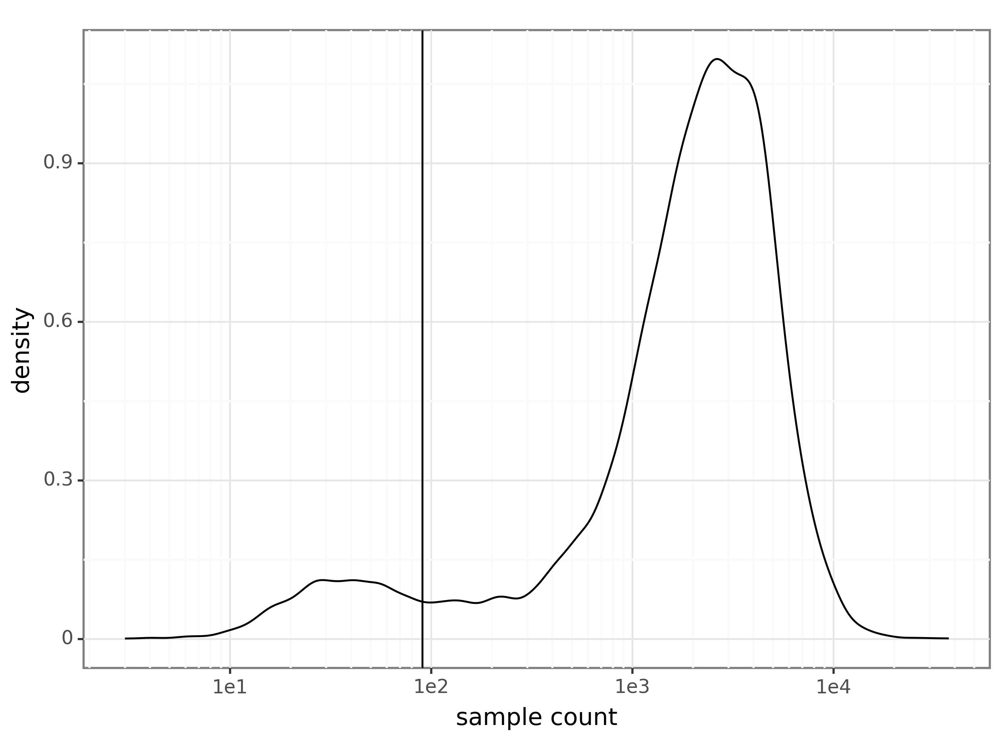

<Figure Size: (1280 x 960)>

In [100]:
ggplot(sample3_info, aes(x = "sample count")) + geom_density() + theme_bw() + theme(dpi=200) + geom_vline(
xintercept = 90) + scale_x_log10()

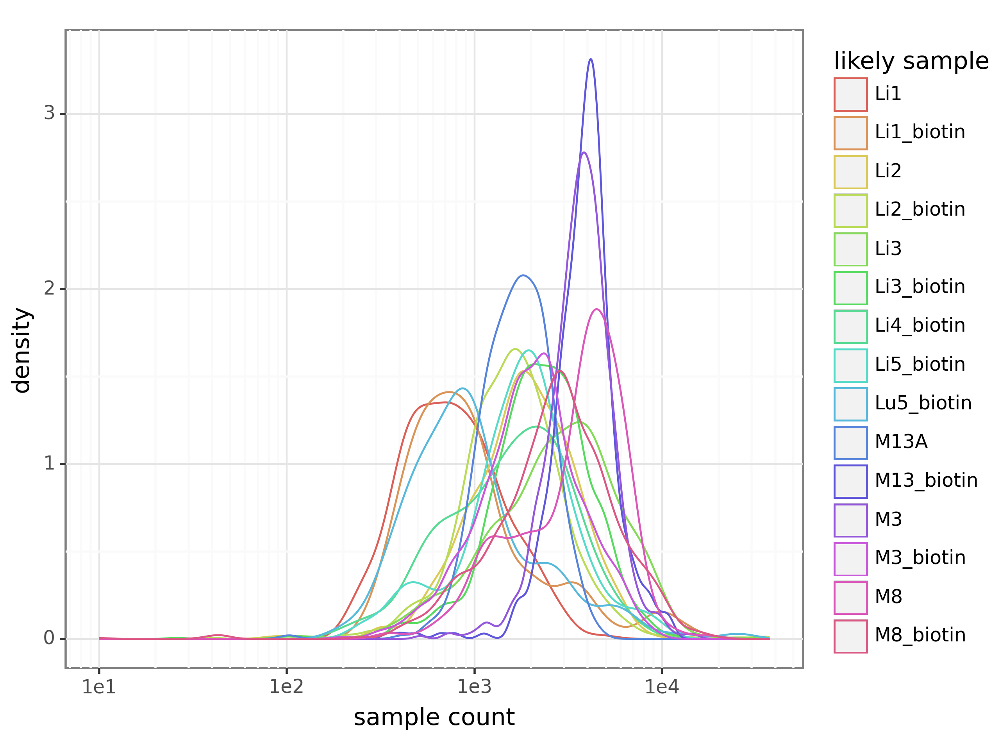

<Figure Size: (1280 x 960)>

In [101]:
ggplot(sample3_info[sample3_info["sample fraction"] > 0.8], aes(x = "sample count", color = "likely sample")) + \
geom_density() + theme_bw() + theme(dpi=200) + scale_x_log10() 

In [102]:
sample3_info.loc[sample3_info["likely sample"] == "M13A", "likely sample"] = "M13"

In [103]:
expected_lane3_counts = pd.DataFrame.from_dict({"M3_biotin": 8000, "M3": 6000, "M8_biotin": 7000, "M8": 6000,
                                                "M13_biotin": 2400, "M13": 6000, "Li1_biotin": 5700, "Li1": 4000,
                                                "Li2_biotin": 8000, "Li2": 4000, "Li3_biotin": 8000, "Li3": 4000,
                                                "Li4_biotin": 2000, "Li5_biotin": 2000, "Lu5_biotin": 2000}, 
                                                orient="index").reset_index().rename(columns = {0: "count"})
expected_lane3_counts

,index,count
0,M3_biotin,8000
1,M3,6000
2,M8_biotin,7000
3,M8,6000
4,M13_biotin,2400
5,M13,6000
6,Li1_biotin,5700
7,Li1,4000
8,Li2_biotin,8000
9,Li2,4000


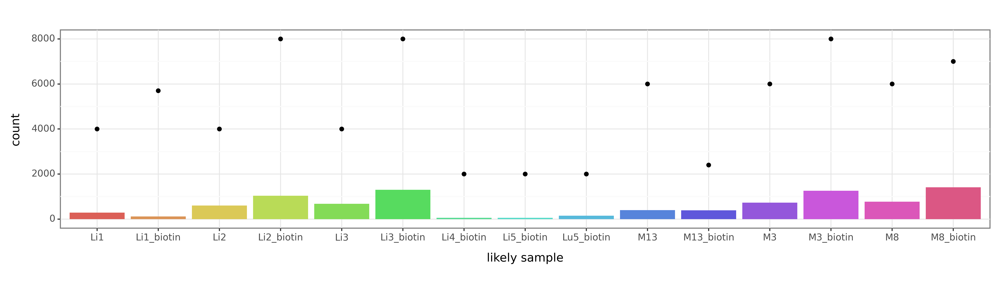

<Figure Size: (2600 x 740)>

In [104]:
## comparing to expected numbers from sort
ggplot(sample3_info[sample3_info["sample fraction"] >= .8], aes(x="likely sample", fill = "likely sample")) + \
geom_bar() + theme_bw() + theme(dpi = 200, legend_position = "none", figure_size=(13,3.7)) + geom_point(aes(
x = "index", y="count"), color = "black", inherit_aes = False, data = expected_lane3_counts)

In [105]:
sample3_info.shape

(12249, 19)

## remove cells is the likely sample HTO is less than 80% of all sample HTOs (excluding biotin, donor HTOs)

In [106]:
sample3_info[sample3_info["sample fraction"] >= .8].shape

(9243, 19)

In [107]:
12249-9243

3006

In [108]:
s3_likely_samples = sample3_info[sample3_info["sample fraction"] >= 0.8][["likely sample"]]
s3_likely_samples.head()

,likely sample
AAACCTGAGACAAGCC-1,M8
AAACCTGAGGAGTACC-1,Li3_biotin
AAACCTGAGGCGTACA-1,M8_biotin
AAACCTGAGGTACTCT-1,M8_biotin
AAACCTGAGGTCGGAT-1,M8_biotin


In [109]:
s3_likely_samples.shape

(9243, 1)

In [110]:
s3_likely_samples["biotin_interaction"] = s3_hto_info[
    s3_likely_samples.index, "biotin_interaction"].X.toarray().flatten()

In [111]:
s3_likely_samples["biotin_donor"] = s3_hto_info[
    s3_likely_samples.index, "donor"].X.toarray().flatten()

In [112]:
s3_likely_samples.head()

,likely sample,biotin_interaction,biotin_donor
AAACCTGAGACAAGCC-1,M8,8.0,4.0
AAACCTGAGGAGTACC-1,Li3_biotin,107.0,23.0
AAACCTGAGGCGTACA-1,M8_biotin,36.0,8.0
AAACCTGAGGTACTCT-1,M8_biotin,760.0,120.0
AAACCTGAGGTCGGAT-1,M8_biotin,49.0,12.0


In [113]:
s3_likely_samples["biotin sample"] = s3_likely_samples["likely sample"].str.contains("biotin")
s3_likely_samples["biotin sample"]

AAACCTGAGACAAGCC-1    False
AAACCTGAGGAGTACC-1     True
AAACCTGAGGCGTACA-1     True
AAACCTGAGGTACTCT-1     True
AAACCTGAGGTCGGAT-1     True
                      ...  
TTTGTCACATCCGCGA-1    False
TTTGTCAGTACTTGAC-1     True
TTTGTCAGTCGATTGT-1     True
TTTGTCAGTTCACGGC-1     True
TTTGTCATCTCCCTGA-1    False
Name: biotin sample, Length: 9243, dtype: bool

## compare biotin levels for cells that were sorted as biotin + vs background population

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_density : Removed 4 rows containing non-finite values.


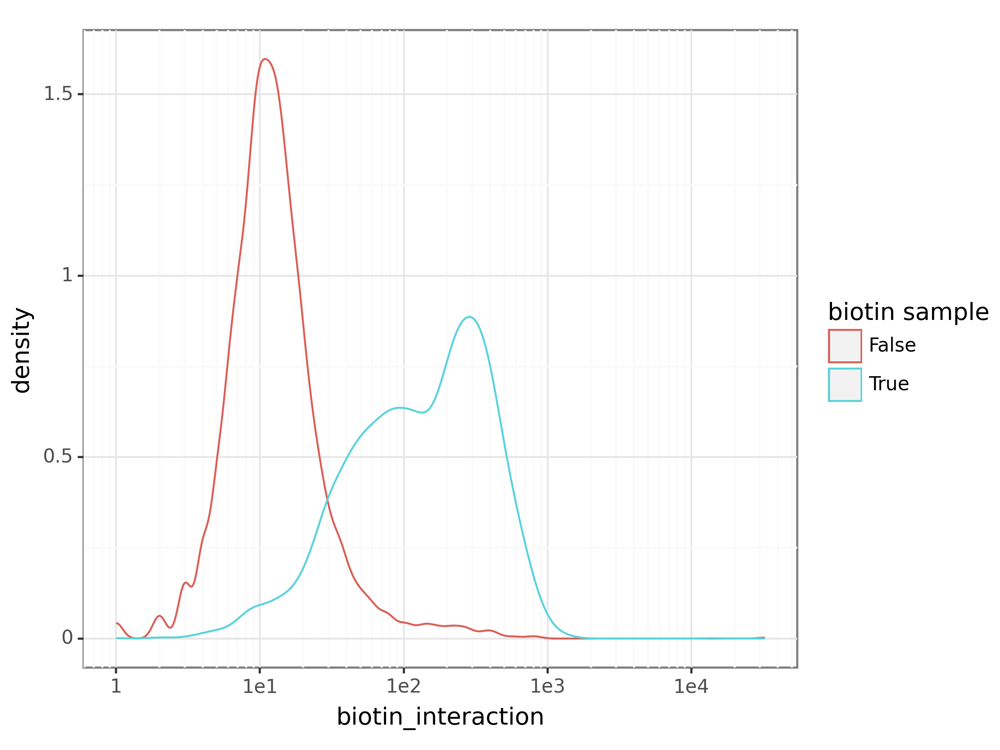

<Figure Size: (1280 x 960)>

In [114]:
ggplot(s3_likely_samples, aes(x = "biotin_interaction", color = "biotin sample")) + geom_density() + theme_bw() + \
theme(dpi=200) + scale_x_log10()

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_density : Removed 14 rows containing non-finite values.


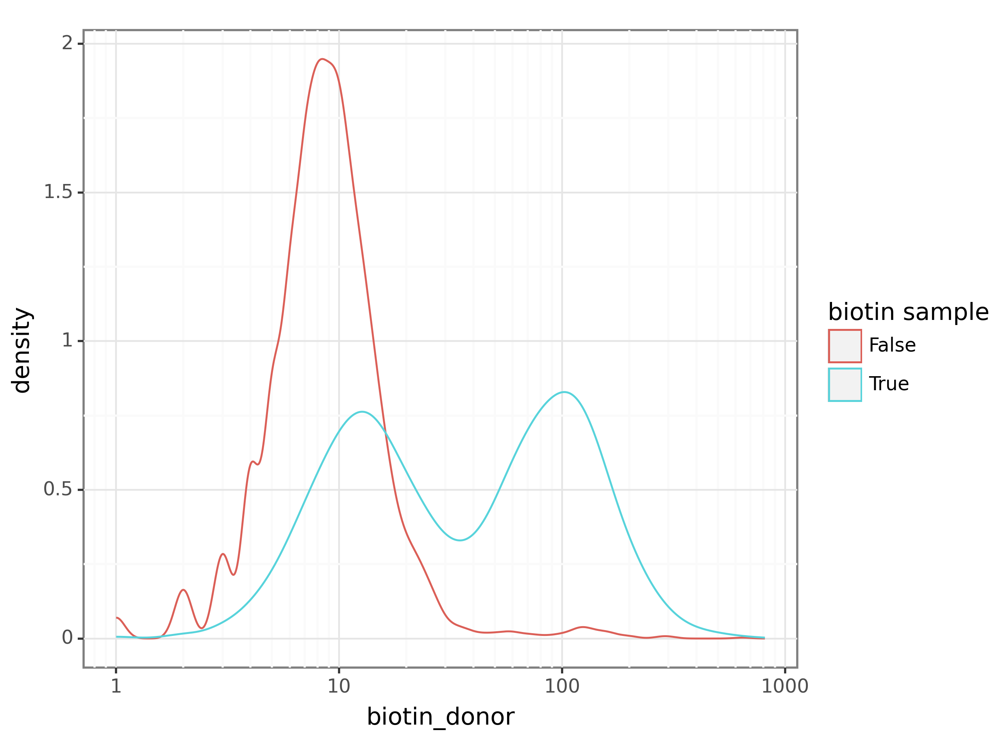

<Figure Size: (1280 x 960)>

In [115]:
ggplot(s3_likely_samples, aes(x = "biotin_donor", color = "biotin sample")) + geom_density() + theme_bw() + \
theme(dpi=200) + scale_x_log10()

In [116]:
sample3_data = sample3_data[s3_likely_samples.index,:]
sample3_data.obs = sample3_data.obs.merge(s3_likely_samples, left_index = True, right_index = True)
sample3_data.obs = sample3_data.obs.merge(sample3_info[["sample count"]], left_index = True, right_index = True)

In [117]:
sample3_data

AnnData object with n_obs × n_vars = 9243 × 13868
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'likely sample', 'biotin_interaction', 'biotin_donor', 'biotin sample', 'sample count'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_counts'

## normalize biotin, donor levels by sample HTO count

In [118]:
sample3_data.obs["cell_norm_biotin"] = sample3_data.obs["biotin_interaction"]/sample3_data.obs["sample count"]

In [119]:
sample3_data.obs["cell_norm_donor"] = sample3_data.obs["biotin_donor"]/sample3_data.obs["sample count"]

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_density : Removed 4 rows containing non-finite values.


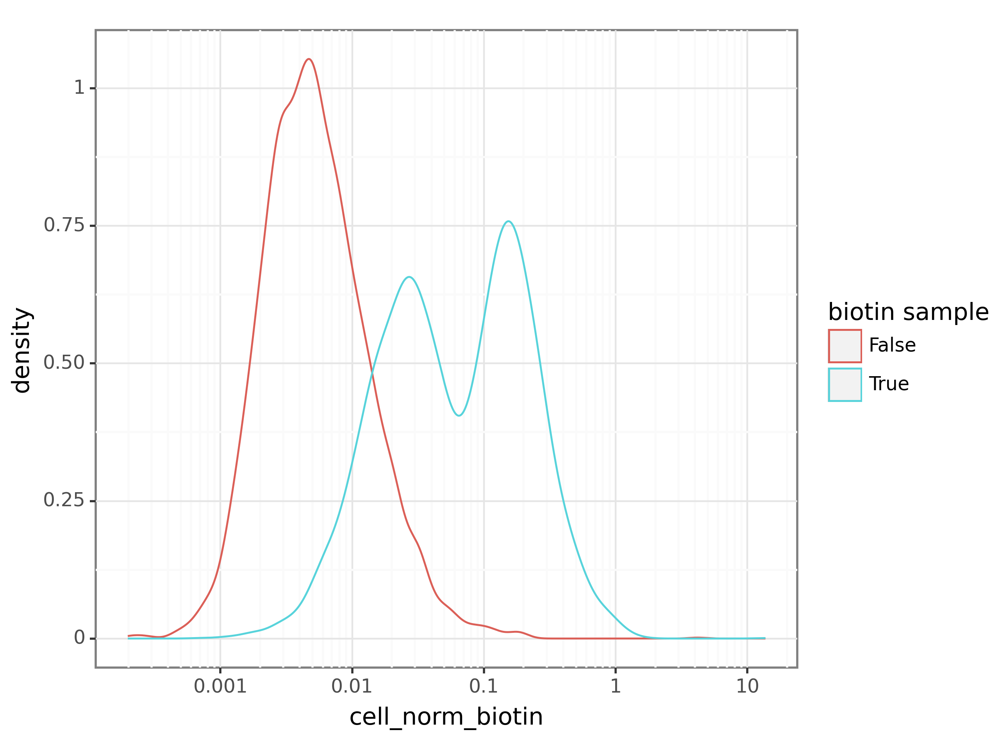

<Figure Size: (1280 x 960)>

In [120]:
ggplot(sample3_data.obs, aes(x = "cell_norm_biotin", color = "biotin sample")) + geom_density() + theme_bw() + theme(
    dpi=200) + scale_x_log10()

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_density : Removed 14 rows containing non-finite values.


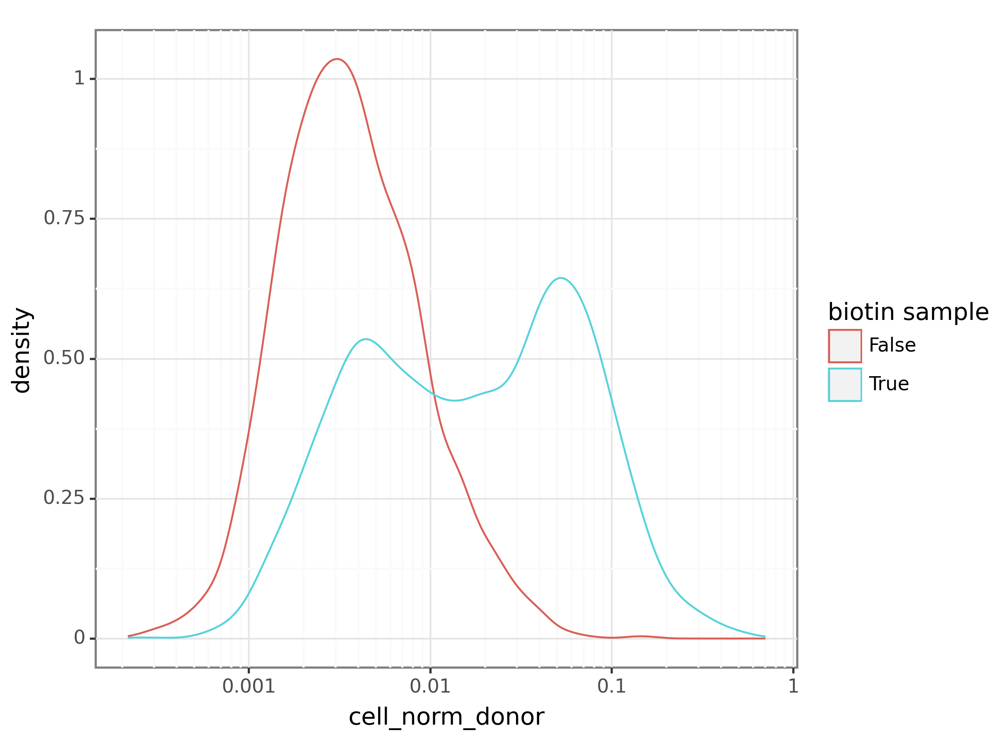

<Figure Size: (1280 x 960)>

In [121]:
ggplot(sample3_data.obs, aes(x = "cell_norm_donor", color = "biotin sample")) + geom_density() + theme_bw() + theme(
    dpi=200) + scale_x_log10()

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_density : Removed 4 rows containing non-finite values.


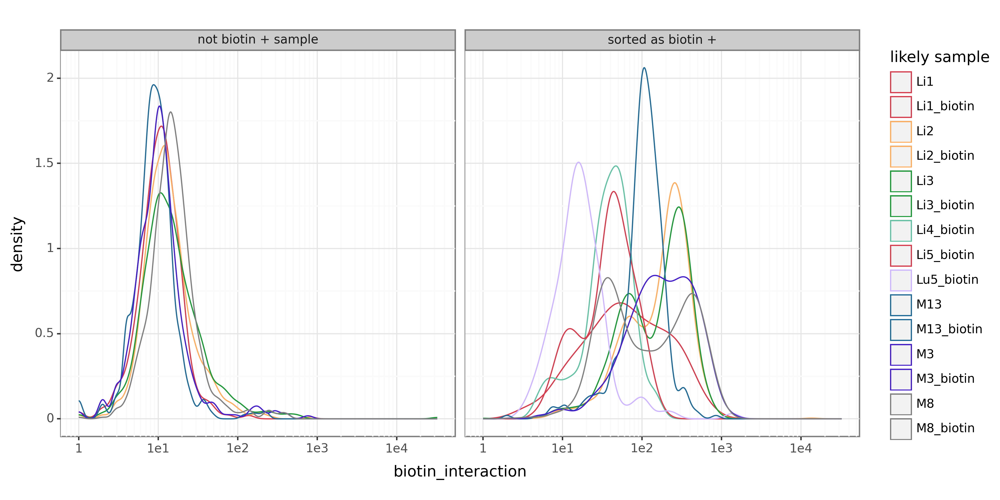

<Figure Size: (2000 x 1000)>

In [122]:
ggplot(sample3_data.obs.rename(columns = {"biotin sample": "biotin_sample"}), aes(
    x = "biotin_interaction", color = "likely sample")) + geom_density() + theme_bw() + theme(
    dpi=200, figure_size=(10, 5)) + scale_x_log10() + facet_wrap("~ biotin_sample", labeller = lab) + \
scale_color_manual(["#d53e4f", "#d53e4f", # Li1
                    "#fdae61", "#fdae61", # Li2
                    "#1f9939", "#1f9939", # Li3
                    "#66c2a5",  # Li4
                    "#d53e4f", # Li5
                    "#ceb7ff",# Lu5
                    "#226b96", "#226b96",# M13
                    "#4520c9", "#4520c9",# M3
                    "gray", "gray"# M8
])

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_density : Removed 4 rows containing non-finite values.


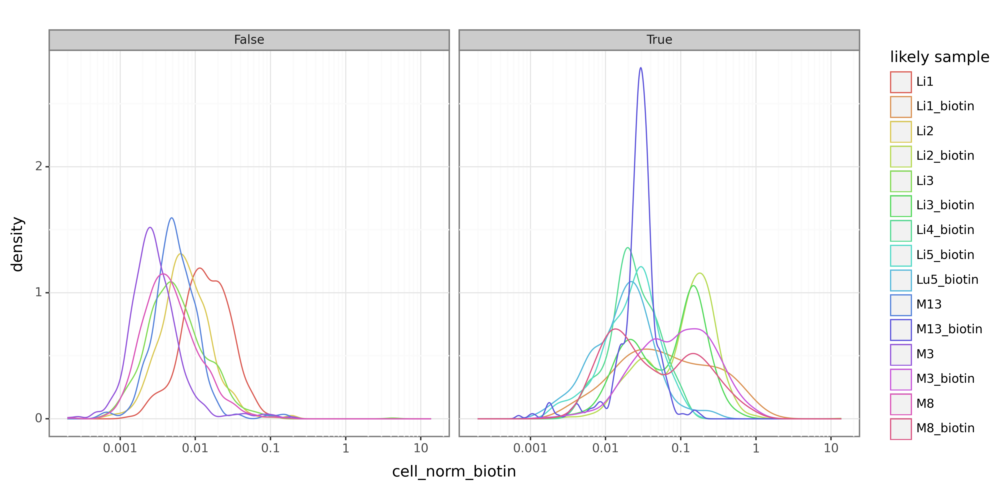

<Figure Size: (2000 x 1000)>

In [123]:
ggplot(sample3_data.obs.rename(columns = {"biotin sample": "biotin_sample"}), aes(
    x = "cell_norm_biotin", color = "likely sample")) + geom_density() + theme_bw() + theme(
    dpi=200, figure_size=(10, 5)) + scale_x_log10() + facet_wrap("~ biotin_sample")

In [124]:
sample3_data.layers["raw_counts"] = sample3_data.X.copy()

In [126]:
sample3_data.var

,gene_ids,feature_types,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_counts
Sox17,ENSMUSG00000025902,Gene Expression,False,112,0.017817,99.109131,224.0,224.0
Mrpl15,ENSMUSG00000033845,Gene Expression,False,5809,1.181276,53.794146,14851.0,14742.0
Lypla1,ENSMUSG00000025903,Gene Expression,False,5310,0.831053,57.763283,10448.0,10399.0
Tcea1,ENSMUSG00000033813,Gene Expression,False,7703,1.898982,38.728921,23874.0,23718.0
Atp6v1h,ENSMUSG00000033793,Gene Expression,False,4989,0.683662,60.316577,8595.0,8546.0
...,...,...,...,...,...,...,...,...
Csprs,ENSMUSG00000062783,Gene Expression,False,245,0.021397,98.051225,269.0,267.0
Vamp7,ENSMUSG00000051412,Gene Expression,False,2427,0.270204,80.695196,3397.0,3368.0
Tmlhe,ENSMUSG00000079834,Gene Expression,False,751,0.071110,94.026408,894.0,883.0
CAAA01147332.1,ENSMUSG00000095742,Gene Expression,False,6296,2.843064,49.920458,35743.0,35597.0


## normalize GEX values

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/scanpy/experimental/pp/_normalization.py:58: RuntimeWarning: invalid value encountered in divide
/tmp/ipykernel_293954/3406612910.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/scanpy/experimental/pp/_normalization.py:58: RuntimeWarning: invalid value encountered in divide
/tmp/ipykernel_293954/3406612910.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/scanpy/experimental/pp/_normalization.py:58: RuntimeWarning: invalid value encountered in divide
/tmp/ipykernel_293954/3406612910.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pan

   theta        stat     value
0    0.1  gene_means  0.084861
1    0.1  gene_means -0.059100
2    0.1  gene_means -0.035759
3    0.1  gene_means -0.026506
4    0.1  gene_means -0.004008


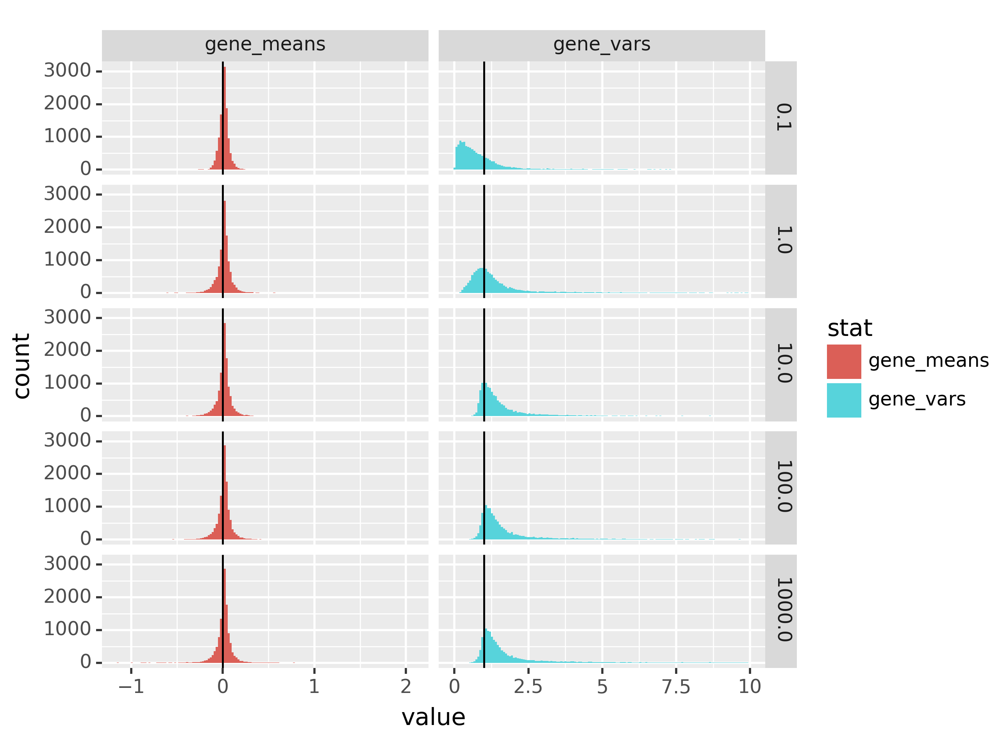

In [125]:
determine_theta(sample3_data)

In [127]:
sample3_data.layers

Layers with keys: raw_counts, theta_0.1, theta_1, theta_10, theta_100, theta_1000

## pick theta 1: vars centered ~ 1

In [128]:
sample3_data.X = sample3_data.layers["theta_1"].copy()
for lay in ["theta_0.1", "theta_10", "theta_100", "theta_1000"]:
    del sample3_data.layers[lay]
sample3_data.layers

Layers with keys: raw_counts, theta_1

In [129]:
sample3_data.write_h5ad("lcmv_SNH3.h5ad")

## finally, SNH sample 4

In [130]:
sample4_data = sc.read_10x_mtx("/Genomics/pritykinlab/share/uLIPSTIC/data/lcmv_v2/SNH4/outs/filtered_feature_bc_matrix/",
                               gex_only = False)

In [131]:
sample4_data.var

,gene_ids,feature_types
Xkr4,ENSMUSG00000051951,Gene Expression
Gm1992,ENSMUSG00000089699,Gene Expression
Gm19938,ENSMUSG00000102331,Gene Expression
Gm37381,ENSMUSG00000102343,Gene Expression
Rp1,ENSMUSG00000025900,Gene Expression
...,...,...
Lu3_biotin,13,Custom
Lu3,14,Custom
Lu4_biotin,15,Custom
biotin_interaction,C0436,Custom


In [132]:
s4_hto_info = sample4_data[:, sample4_data.var_names[sample4_data.var.feature_types == "Custom"]]
s4_hto_info.shape 

(13123, 17)

In [133]:
sample4_data = sample4_data[:,sample4_data.var_names[sample4_data.var.feature_types != "Custom"]]

In [134]:
sample4_data.shape

(13123, 32285)

In [135]:
sample4_data.var['mt'] = sample4_data.var_names.str.startswith('mt-')  # annotate mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(sample4_data, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

/tmp/ipykernel_293954/2423856792.py:1: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.


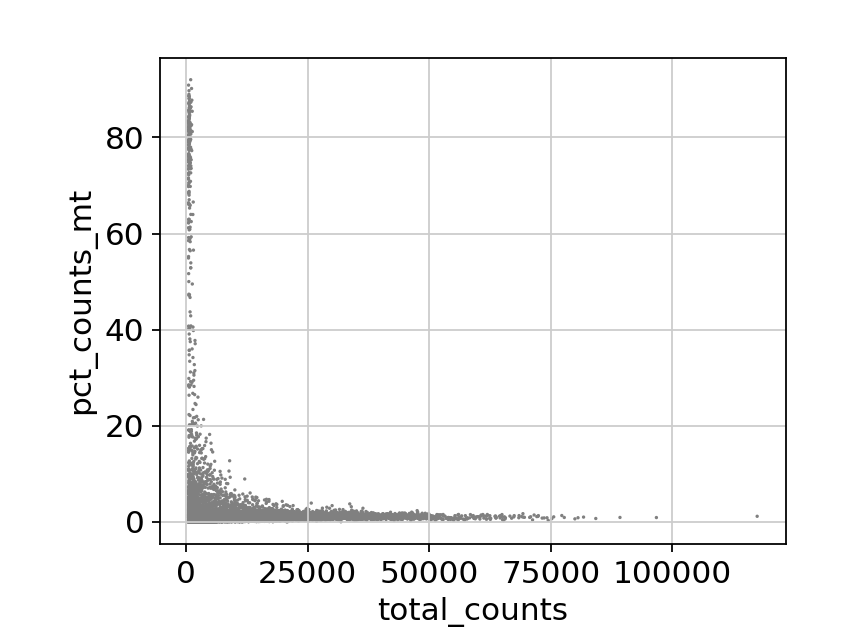

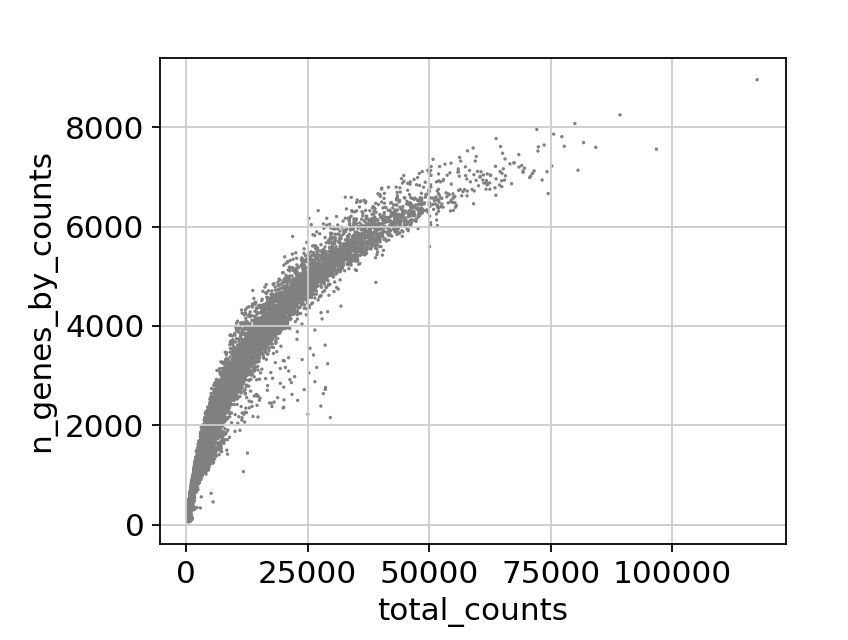

In [136]:
sc.pl.scatter(sample4_data, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(sample4_data, x='total_counts', y='n_genes_by_counts') 

In [137]:
sample4_data.shape

(13123, 32285)

## filter out high MT

In [138]:
sample4_data = sample4_data[sample4_data.obs["pct_counts_mt"] <= 15]

In [139]:
sample4_data.shape

(12847, 32285)

In [140]:
13123-12847 # mt cells

276

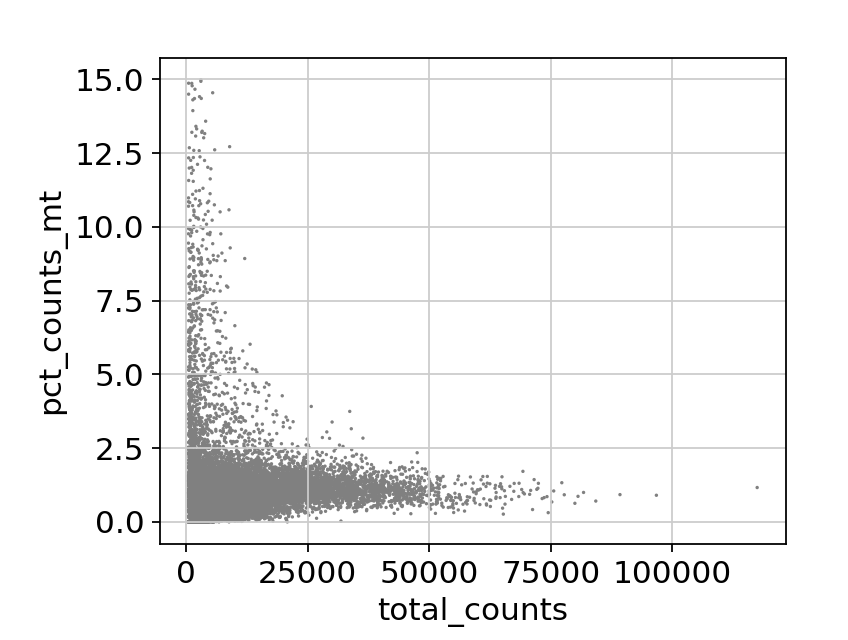

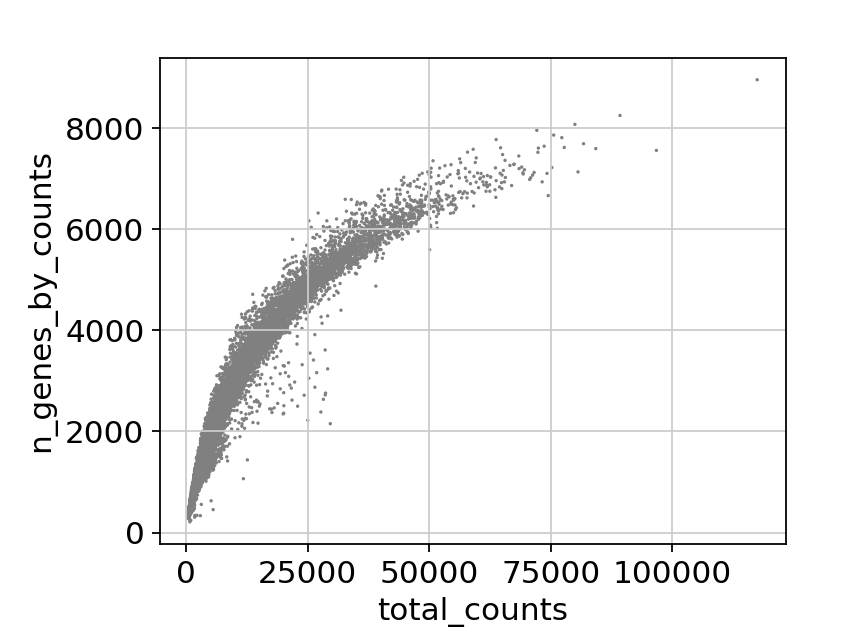

In [141]:
sc.pl.scatter(sample4_data, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(sample4_data, x='total_counts', y='n_genes_by_counts') 

In [142]:
sample4_data.shape

(12847, 32285)

## filter by high total counts

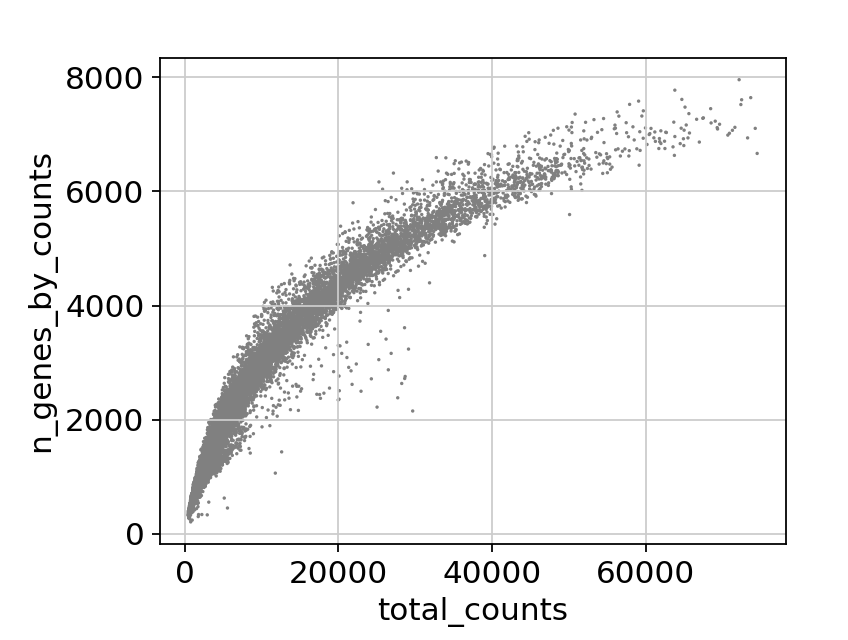

In [143]:
sample4_data = sample4_data[sample4_data.obs["total_counts"] <= 75000]
sc.pl.scatter(sample4_data, x='total_counts', y='n_genes_by_counts') 

In [144]:
sample4_data.shape

(12836, 32285)

In [145]:
12847-12836

11

## filter by low cells/genes

In [146]:
sc.pp.filter_genes(sample4_data, 0.005*sample3_data.shape[0])
sc.pp.filter_cells(sample4_data, min_genes = 200)

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:248: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.


In [147]:
sample4_data.shape

(12836, 14959)

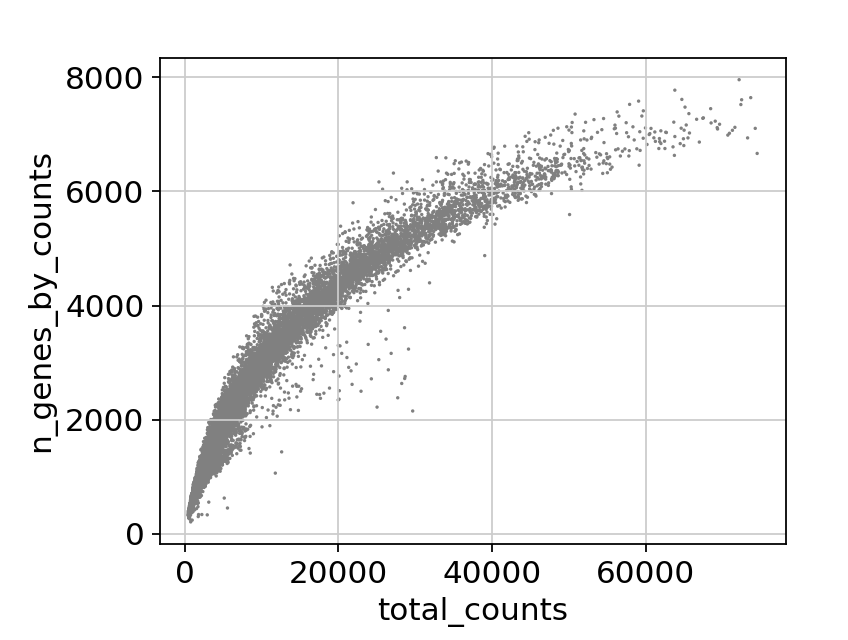

In [148]:
sc.pl.scatter(sample4_data, x='total_counts', y='n_genes_by_counts') 

In [149]:
s4_hto_info = s4_hto_info[sample4_data.obs_names,:]
s4_hto_info.shape

(12836, 17)

## plot raw biotin, donor levels

/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/pandas/core/arraylike.py:397: RuntimeWarning: divide by zero encountered in log10
/Genomics/argo/users/skwalker/scvi/lib/python3.9/site-packages/plotnine/layer.py:333: PlotnineWarning: stat_density : Removed 53 rows containing non-finite values.


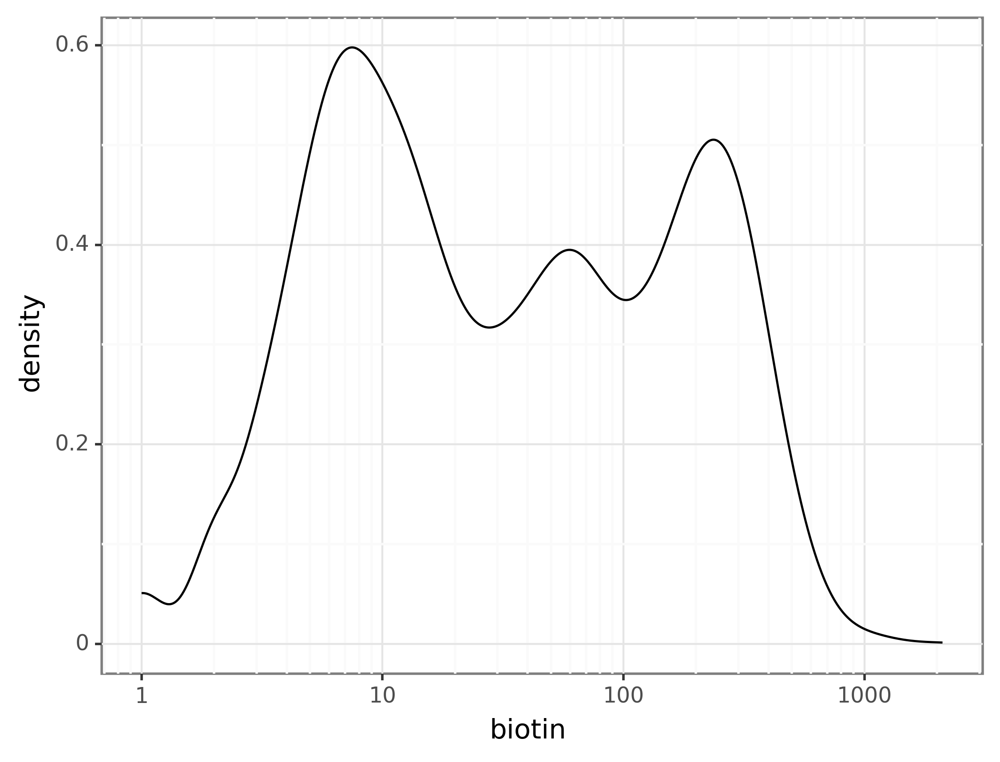

<ggplot: (8734284701197)>

In [181]:
ggplot(pd.DataFrame({"biotin": s4_hto_info[:,"biotin_interaction"].X.toarray().flatten()}), aes(
    x="biotin")) + geom_density()+ theme_bw() + theme(dpi=200) + scale_x_log10()

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_density : Removed 149 rows containing non-finite values.


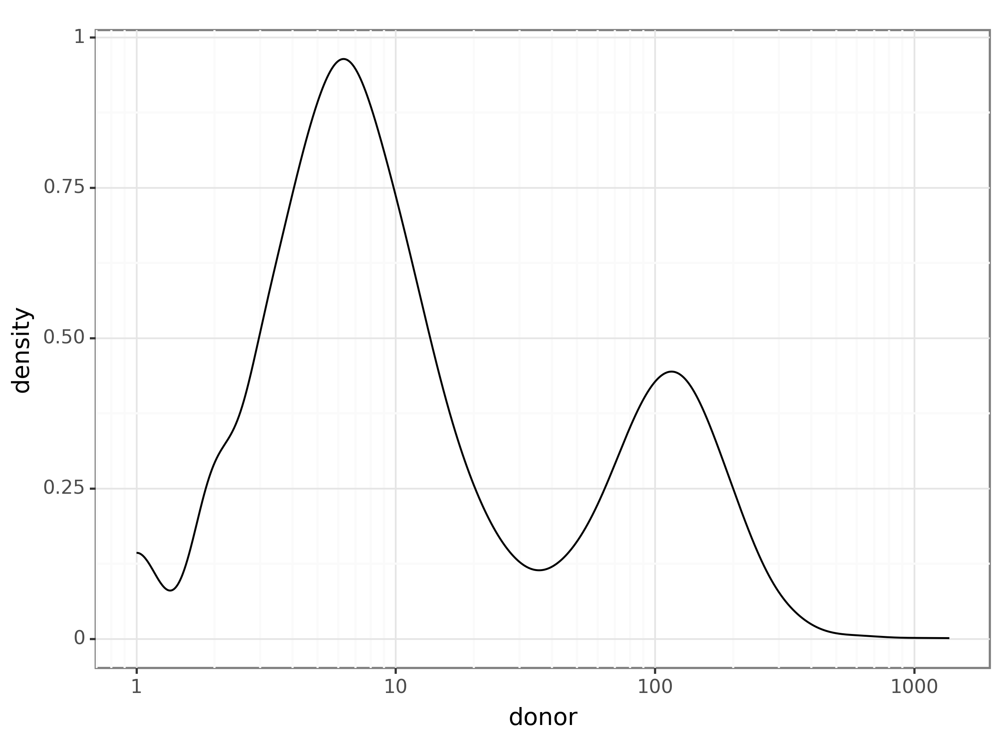

<Figure Size: (1280 x 960)>

In [150]:
ggplot(pd.DataFrame({"donor": s4_hto_info[:,"donor"].X.toarray().flatten()}), aes(
    x="donor")) + geom_density()+ theme_bw() + theme(dpi=200) + scale_x_log10()

## start assigning cells to likely sample

In [151]:
sample4_info = pd.DataFrame(s4_hto_info[:,s4_hto_info.var_names[
    ~s4_hto_info.var_names.isin(["biotin_interaction", "donor"])]].X.toarray(), index=s4_hto_info.obs_names, 
                            columns = s4_hto_info.var_names[~s4_hto_info.var_names.isin(
                                ["biotin_interaction", "donor"])])

In [152]:
sample4_info.head()

,S1_biotin,S1,S2_biotin,S2,S3_biotin,S3,S4_biotin,S5_biotin,Lu1_biotin,Lu1,Lu2_biotin,Lu2,Lu3_biotin,Lu3,Lu4_biotin
AAACCTGAGAGTCTGG-1,1416.0,10.0,3.0,8.0,7.0,4.0,2.0,0.0,12.0,8.0,1.0,4.0,1.0,2.0,0.0
AAACCTGAGCGTAATA-1,2.0,5.0,869.0,5.0,9.0,4.0,1.0,2.0,11.0,15.0,4.0,10.0,2.0,0.0,1.0
AAACCTGAGCGTAGTG-1,2.0,6.0,6.0,4.0,6.0,4.0,2.0,4.0,8.0,4079.0,0.0,1.0,0.0,3.0,0.0
AAACCTGAGGATGGTC-1,3.0,3.0,2.0,3.0,9.0,0.0,4.0,1.0,5.0,1.0,2.0,0.0,1.0,1.0,99.0
AAACCTGAGGCTCAGA-1,0.0,3.0,1.0,2.0,6.0,1.0,1.0,1.0,4.0,8.0,0.0,1.0,3.0,2458.0,2.0


In [153]:
sample4_info["likely sample"] = sample4_info.T.idxmax()
sample4_info.head()

,S1_biotin,S1,S2_biotin,S2,S3_biotin,S3,S4_biotin,S5_biotin,Lu1_biotin,Lu1,Lu2_biotin,Lu2,Lu3_biotin,Lu3,Lu4_biotin,likely sample
AAACCTGAGAGTCTGG-1,1416.0,10.0,3.0,8.0,7.0,4.0,2.0,0.0,12.0,8.0,1.0,4.0,1.0,2.0,0.0,S1_biotin
AAACCTGAGCGTAATA-1,2.0,5.0,869.0,5.0,9.0,4.0,1.0,2.0,11.0,15.0,4.0,10.0,2.0,0.0,1.0,S2_biotin
AAACCTGAGCGTAGTG-1,2.0,6.0,6.0,4.0,6.0,4.0,2.0,4.0,8.0,4079.0,0.0,1.0,0.0,3.0,0.0,Lu1
AAACCTGAGGATGGTC-1,3.0,3.0,2.0,3.0,9.0,0.0,4.0,1.0,5.0,1.0,2.0,0.0,1.0,1.0,99.0,Lu4_biotin
AAACCTGAGGCTCAGA-1,0.0,3.0,1.0,2.0,6.0,1.0,1.0,1.0,4.0,8.0,0.0,1.0,3.0,2458.0,2.0,Lu3


In [154]:
sample4_info["sample count"] = [row[row["likely sample"]] for _, row in sample4_info.iterrows()]

In [155]:
sample4_info.head()

,S1_biotin,S1,S2_biotin,S2,S3_biotin,S3,S4_biotin,S5_biotin,Lu1_biotin,Lu1,Lu2_biotin,Lu2,Lu3_biotin,Lu3,Lu4_biotin,likely sample,sample count
AAACCTGAGAGTCTGG-1,1416.0,10.0,3.0,8.0,7.0,4.0,2.0,0.0,12.0,8.0,1.0,4.0,1.0,2.0,0.0,S1_biotin,1416.0
AAACCTGAGCGTAATA-1,2.0,5.0,869.0,5.0,9.0,4.0,1.0,2.0,11.0,15.0,4.0,10.0,2.0,0.0,1.0,S2_biotin,869.0
AAACCTGAGCGTAGTG-1,2.0,6.0,6.0,4.0,6.0,4.0,2.0,4.0,8.0,4079.0,0.0,1.0,0.0,3.0,0.0,Lu1,4079.0
AAACCTGAGGATGGTC-1,3.0,3.0,2.0,3.0,9.0,0.0,4.0,1.0,5.0,1.0,2.0,0.0,1.0,1.0,99.0,Lu4_biotin,99.0
AAACCTGAGGCTCAGA-1,0.0,3.0,1.0,2.0,6.0,1.0,1.0,1.0,4.0,8.0,0.0,1.0,3.0,2458.0,2.0,Lu3,2458.0


In [156]:
sample4_info["total count"] = sample4_info.drop(columns = ["likely sample", "sample count"]).sum(axis = 1)

In [157]:
sample4_info.head()

,S1_biotin,S1,S2_biotin,S2,S3_biotin,S3,S4_biotin,S5_biotin,Lu1_biotin,Lu1,Lu2_biotin,Lu2,Lu3_biotin,Lu3,Lu4_biotin,likely sample,sample count,total count
AAACCTGAGAGTCTGG-1,1416.0,10.0,3.0,8.0,7.0,4.0,2.0,0.0,12.0,8.0,1.0,4.0,1.0,2.0,0.0,S1_biotin,1416.0,1478.0
AAACCTGAGCGTAATA-1,2.0,5.0,869.0,5.0,9.0,4.0,1.0,2.0,11.0,15.0,4.0,10.0,2.0,0.0,1.0,S2_biotin,869.0,940.0
AAACCTGAGCGTAGTG-1,2.0,6.0,6.0,4.0,6.0,4.0,2.0,4.0,8.0,4079.0,0.0,1.0,0.0,3.0,0.0,Lu1,4079.0,4125.0
AAACCTGAGGATGGTC-1,3.0,3.0,2.0,3.0,9.0,0.0,4.0,1.0,5.0,1.0,2.0,0.0,1.0,1.0,99.0,Lu4_biotin,99.0,134.0
AAACCTGAGGCTCAGA-1,0.0,3.0,1.0,2.0,6.0,1.0,1.0,1.0,4.0,8.0,0.0,1.0,3.0,2458.0,2.0,Lu3,2458.0,2491.0


In [158]:
sample4_info["sample fraction"] = sample4_info["sample count"]/ sample4_info["total count"]

In [159]:
sample4_info.head()

,S1_biotin,S1,S2_biotin,S2,S3_biotin,S3,S4_biotin,S5_biotin,Lu1_biotin,Lu1,Lu2_biotin,Lu2,Lu3_biotin,Lu3,Lu4_biotin,likely sample,sample count,total count,sample fraction
AAACCTGAGAGTCTGG-1,1416.0,10.0,3.0,8.0,7.0,4.0,2.0,0.0,12.0,8.0,1.0,4.0,1.0,2.0,0.0,S1_biotin,1416.0,1478.0,0.958051
AAACCTGAGCGTAATA-1,2.0,5.0,869.0,5.0,9.0,4.0,1.0,2.0,11.0,15.0,4.0,10.0,2.0,0.0,1.0,S2_biotin,869.0,940.0,0.924468
AAACCTGAGCGTAGTG-1,2.0,6.0,6.0,4.0,6.0,4.0,2.0,4.0,8.0,4079.0,0.0,1.0,0.0,3.0,0.0,Lu1,4079.0,4125.0,0.988848
AAACCTGAGGATGGTC-1,3.0,3.0,2.0,3.0,9.0,0.0,4.0,1.0,5.0,1.0,2.0,0.0,1.0,1.0,99.0,Lu4_biotin,99.0,134.0,0.738806
AAACCTGAGGCTCAGA-1,0.0,3.0,1.0,2.0,6.0,1.0,1.0,1.0,4.0,8.0,0.0,1.0,3.0,2458.0,2.0,Lu3,2458.0,2491.0,0.986752


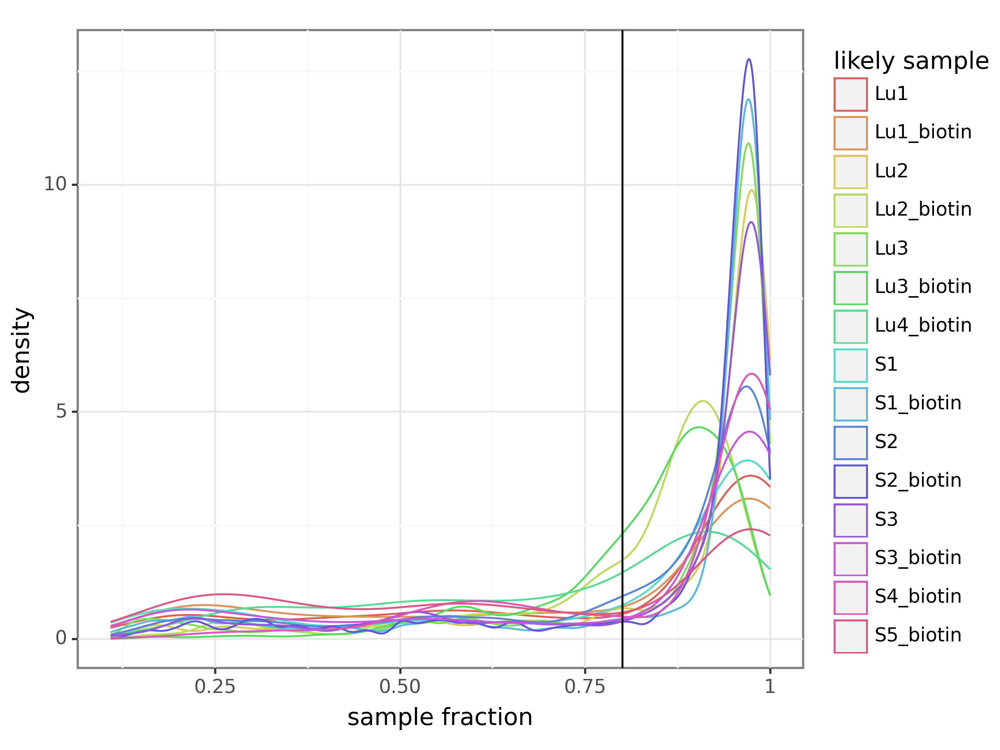

<Figure Size: (1280 x 960)>

In [160]:
ggplot(sample4_info, aes(x = "sample fraction", color = "likely sample")) + geom_density() + theme_bw() + theme(
    dpi=200) + geom_vline(xintercept = 0.8)

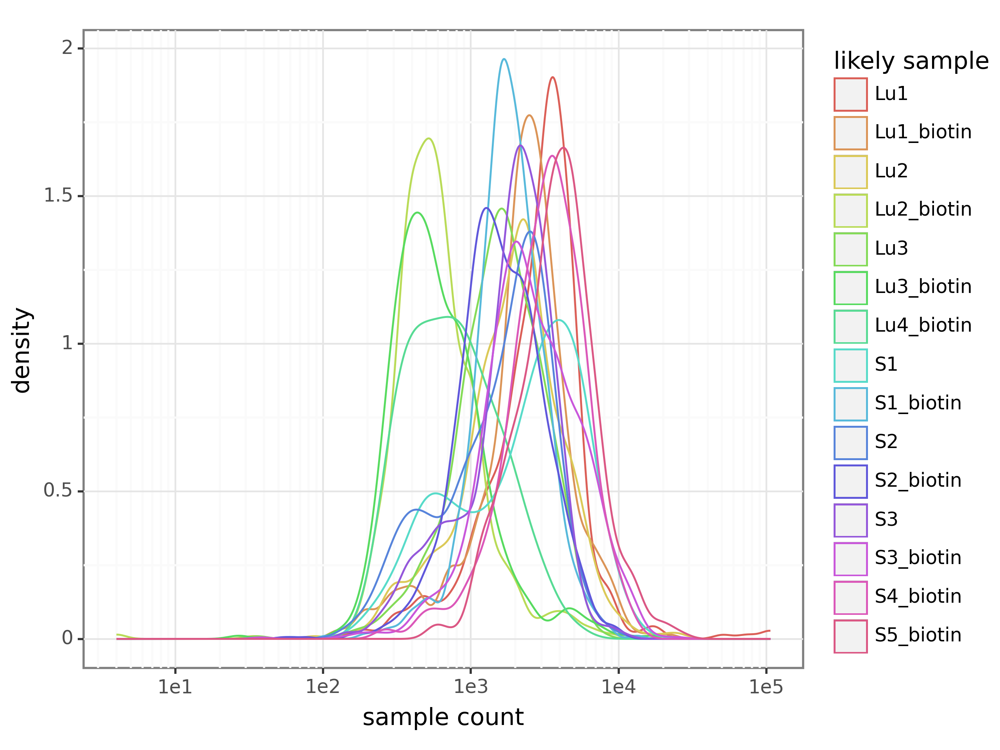

<Figure Size: (1280 x 960)>

In [161]:
ggplot(sample4_info[sample4_info["sample fraction"] >= 0.8], aes(x = "sample count", color = "likely sample")) + \
geom_density() + theme_bw() + theme(dpi=200) + scale_x_log10()

## only keep cells if at least 80% of all sample HTOs are from the assigned sample HTO 

In [163]:
sample4_info[sample4_info["sample fraction"] >= 0.8].shape

(9115, 19)

In [164]:
sample4_info.shape

(12836, 19)

In [165]:
12836-9115

3721

In [166]:
expected_lane4_counts = pd.DataFrame.from_dict({"S1_biotin": 6000, "S1": 5000, "S2_biotin": 6000, "S2": 5000,
                                                "S3_biotin": 6000, "S3": 5000, "S4_biotin": 2010, "S5_biotin": 3020,
                                                "Lu1_biotin": 4000, "Lu1": 4000, "Lu2_biotin": 4000, "Lu2": 4000,
                                                "Lu3_biotin": 4000, "Lu3": 4000, "Lu4_biotin": 2000}, 
                                                orient="index").reset_index().rename(columns = {0: "count"})

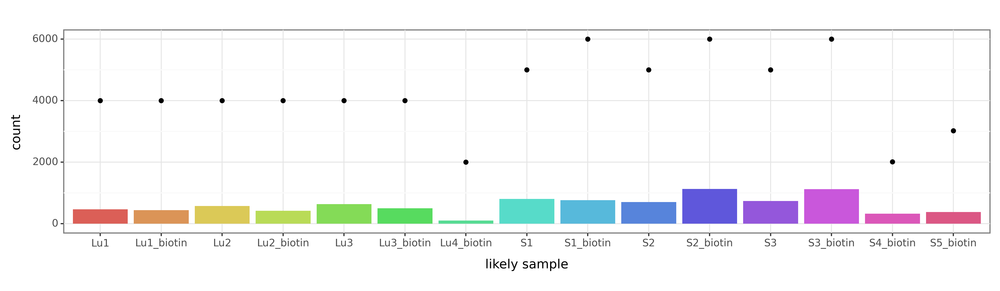

<Figure Size: (2400 x 700)>

In [167]:
## comparign to expected counts from sort/ loaded on sequencer
ggplot(sample4_info[sample4_info["sample fraction"] >= 0.8], aes(x="likely sample", fill = "likely sample")) + \
geom_bar() + theme_bw() + theme(dpi = 200, legend_position = "none", figure_size=(12,3.5)) + geom_point(aes(
x = "index", y="count"), color = "black", inherit_aes = False, data = expected_lane4_counts)

In [168]:
sample4_info.shape

(12836, 19)

In [169]:
s4_likely_samples = sample4_info[sample4_info["sample fraction"] >= 0.8][["likely sample"]]
s4_likely_samples.head()

,likely sample
AAACCTGAGAGTCTGG-1,S1_biotin
AAACCTGAGCGTAATA-1,S2_biotin
AAACCTGAGCGTAGTG-1,Lu1
AAACCTGAGGCTCAGA-1,Lu3
AAACCTGAGTCCTCCT-1,S3


In [170]:
s4_likely_samples.shape

(9115, 1)

In [171]:
s4_likely_samples["biotin_interaction"] = s4_hto_info[
    s4_likely_samples.index, "biotin_interaction"].X.toarray().flatten()

In [172]:
s4_likely_samples["biotin_donor"] = s4_hto_info[
    s4_likely_samples.index, "donor"].X.toarray().flatten()

In [173]:
s4_likely_samples.head()

,likely sample,biotin_interaction,biotin_donor
AAACCTGAGAGTCTGG-1,S1_biotin,263.0,143.0
AAACCTGAGCGTAATA-1,S2_biotin,307.0,80.0
AAACCTGAGCGTAGTG-1,Lu1,3.0,2.0
AAACCTGAGGCTCAGA-1,Lu3,4.0,5.0
AAACCTGAGTCCTCCT-1,S3,9.0,3.0


In [174]:
s4_likely_samples["biotin sample"] = s4_likely_samples["likely sample"].str.contains("biotin")
s4_likely_samples["biotin sample"]

AAACCTGAGAGTCTGG-1     True
AAACCTGAGCGTAATA-1     True
AAACCTGAGCGTAGTG-1    False
AAACCTGAGGCTCAGA-1    False
AAACCTGAGTCCTCCT-1    False
                      ...  
TTTGTCATCACTTCAT-1     True
TTTGTCATCCAAACTG-1    False
TTTGTCATCCACTCCA-1    False
TTTGTCATCGCGATCG-1    False
TTTGTCATCTGCGACG-1    False
Name: biotin sample, Length: 9115, dtype: bool

## compare biotin, donor levels based on sort as biotin + or not

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_density : Removed 33 rows containing non-finite values.


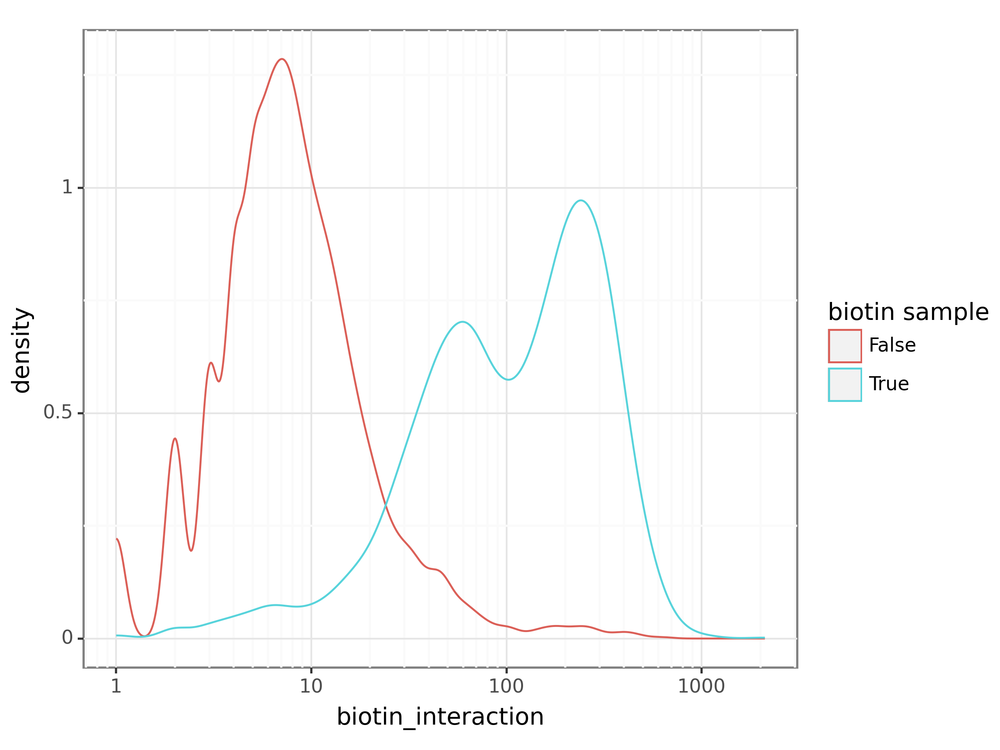

<Figure Size: (1280 x 960)>

In [175]:
ggplot(s4_likely_samples, aes(x = "biotin_interaction", color = "biotin sample")) + geom_density() + theme_bw() + \
theme(dpi=200) + scale_x_log10()

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_density : Removed 111 rows containing non-finite values.


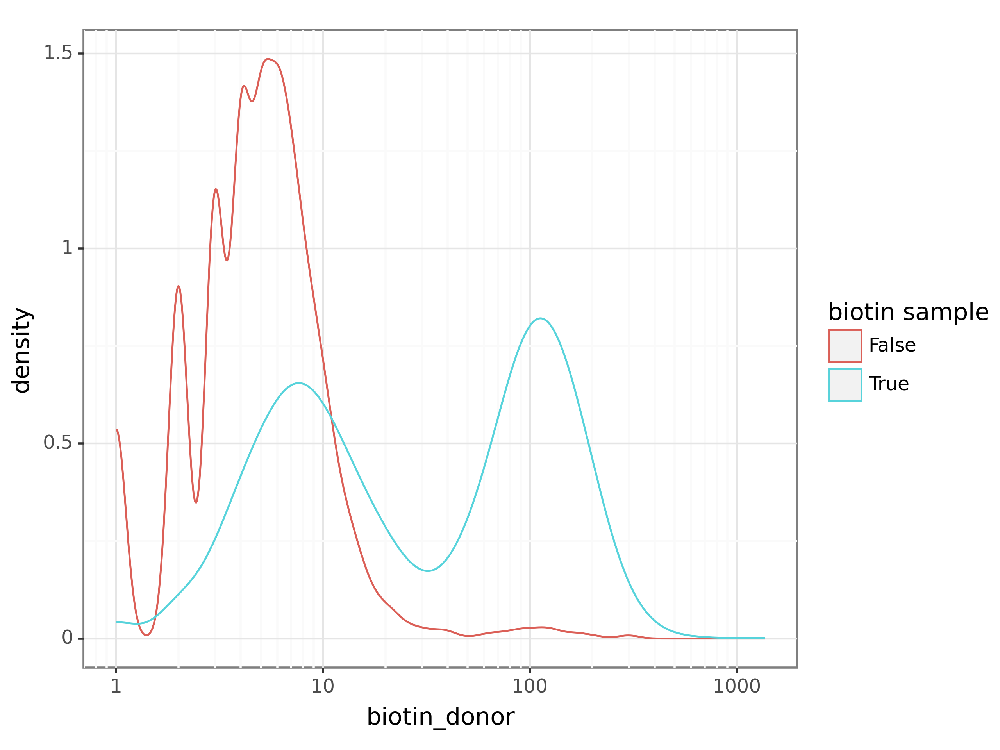

<Figure Size: (1280 x 960)>

In [176]:
ggplot(s4_likely_samples, aes(x = "biotin_donor", color = "biotin sample")) + geom_density() + theme_bw() + \
theme(dpi=200) + scale_x_log10()

In [177]:
sample4_data = sample4_data[s4_likely_samples.index,:]
sample4_data.obs = sample4_data.obs.merge(s4_likely_samples, left_index = True, right_index = True)
sample4_data.obs = sample4_data.obs.merge(sample4_info[["sample count"]], left_index = True, right_index = True)

In [178]:
sample4_data

AnnData object with n_obs × n_vars = 9115 × 14959
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_genes', 'likely sample', 'biotin_interaction', 'biotin_donor', 'biotin sample', 'sample count'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_counts'

In [179]:
sample4_data.obs["cell_norm_biotin"] = sample4_data.obs["biotin_interaction"]/sample4_data.obs["sample count"]

In [180]:
sample4_data.obs["cell_norm_donor"] = sample4_data.obs["biotin_donor"]/sample4_data.obs["sample count"]

## normalize biotin, donor levels based on sample HTO counts

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_density : Removed 33 rows containing non-finite values.


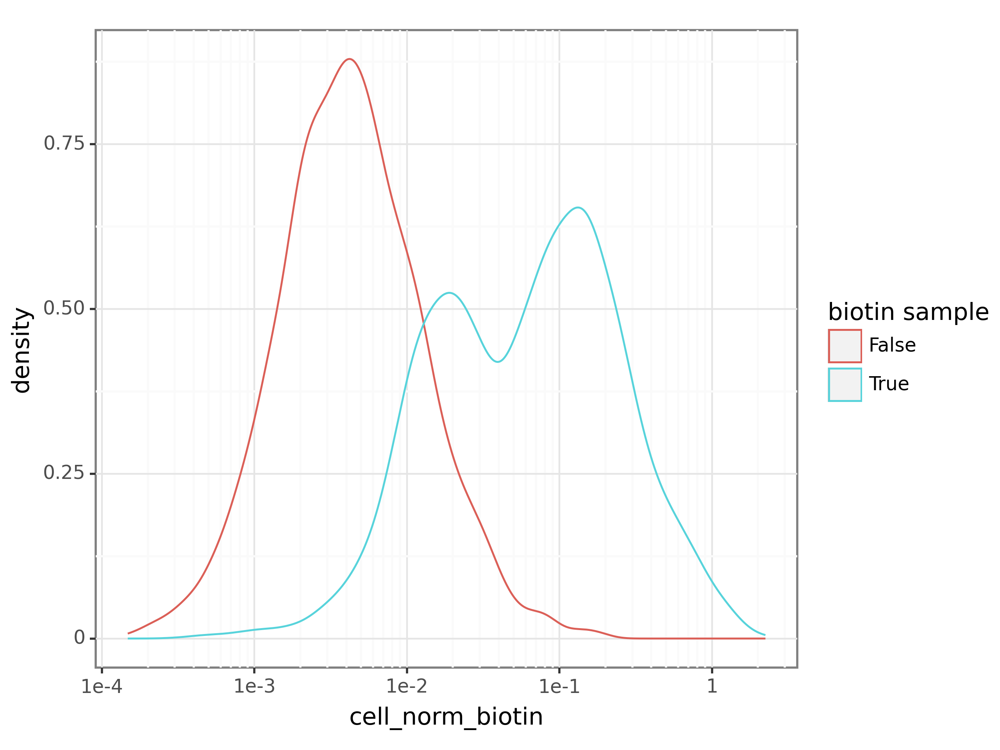

<Figure Size: (1280 x 960)>

In [181]:
ggplot(sample4_data.obs, aes(x = "cell_norm_biotin", color = "biotin sample")) + geom_density() + theme_bw() + theme(
    dpi=200) + scale_x_log10()

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_density : Removed 111 rows containing non-finite values.


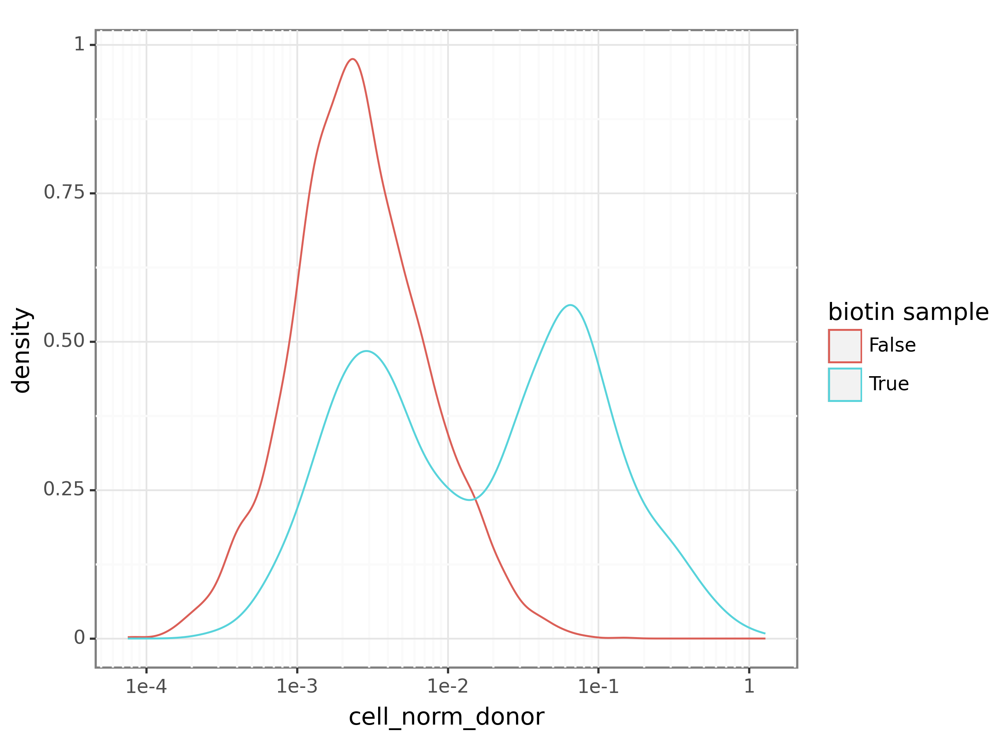

<Figure Size: (1280 x 960)>

In [182]:
ggplot(sample4_data.obs, aes(x = "cell_norm_donor", color = "biotin sample")) + geom_density() + theme_bw() + theme(
    dpi=200) + scale_x_log10()

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_density : Removed 33 rows containing non-finite values.


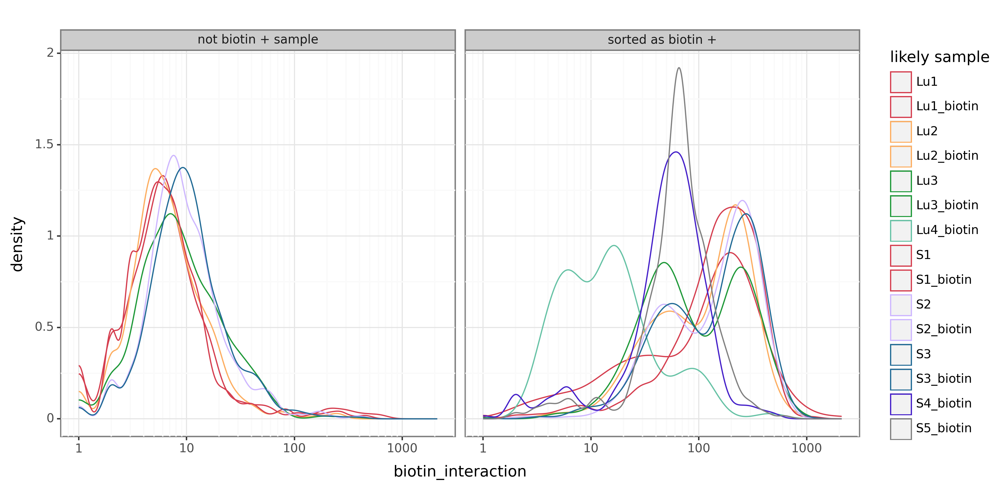

<Figure Size: (2000 x 1000)>

In [183]:
ggplot(sample4_data.obs.rename(columns = {"biotin sample": "biotin_sample"}), aes(
    x = "biotin_interaction", color = "likely sample")) + geom_density() + theme_bw() + theme(
    dpi=200, figure_size=(10, 5)) + scale_x_log10() + facet_wrap("~ biotin_sample", labeller = lab) + \
scale_color_manual(["#d53e4f", "#d53e4f", # Lu1
                    "#fdae61", "#fdae61", # Lu21
                    "#1f9939", "#1f9939", # Lu3
                    "#66c2a5", # Lu4
                    "#d53e4f", "#d53e4f", # S1
                    "#ceb7ff", "#ceb7ff", # S2
                    "#226b96", "#226b96",# S3
                    "#4520c9", # S4
                    "gray"# S5
])

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/plotnine/layer.py:284: PlotnineWarning: stat_density : Removed 33 rows containing non-finite values.


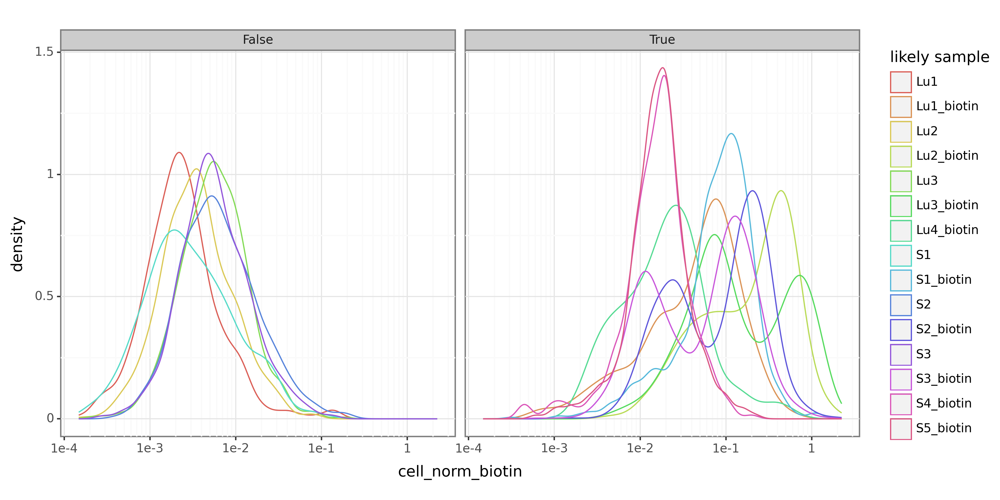

<Figure Size: (2000 x 1000)>

In [184]:
ggplot(sample4_data.obs.rename(columns = {"biotin sample": "biotin_sample"}), aes(
    x = "cell_norm_biotin", color = "likely sample")) + geom_density() + theme_bw() + theme(
    dpi=200, figure_size=(10, 5)) + scale_x_log10() + facet_wrap("~ biotin_sample")

## now normalized GEX values

In [185]:
sample4_data.layers["raw_counts"] = sample4_data.X.copy()

/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/scanpy/experimental/pp/_normalization.py:58: RuntimeWarning: invalid value encountered in divide
/tmp/ipykernel_293954/3406612910.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/scanpy/experimental/pp/_normalization.py:58: RuntimeWarning: invalid value encountered in divide
/tmp/ipykernel_293954/3406612910.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
/Genomics/argo/users/skwalker/scvi_feb2023/lib/python3.9/site-packages/scanpy/experimental/pp/_normalization.py:58: RuntimeWarning: invalid value encountered in divide
/tmp/ipykernel_293954/3406612910.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pan

   theta        stat     value
0    0.1  gene_means  0.158204
1    0.1  gene_means -0.069582
2    0.1  gene_means -0.041854
3    0.1  gene_means -0.019945
4    0.1  gene_means -0.008082


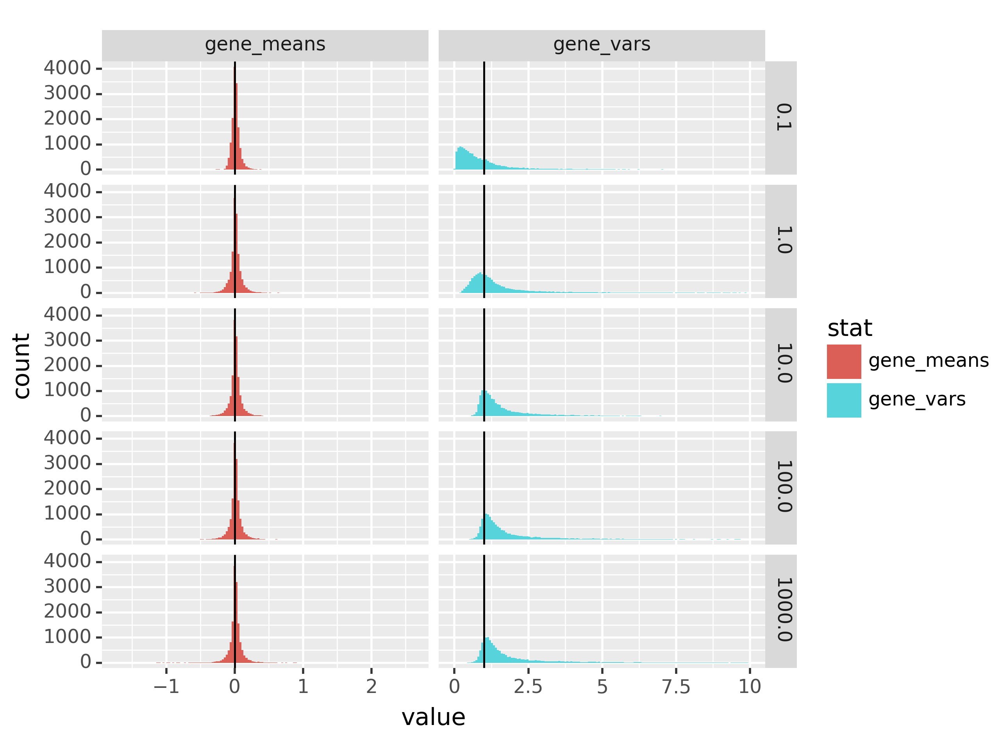

In [186]:
determine_theta(sample4_data)

In [187]:
sample4_data.layers

Layers with keys: raw_counts, theta_0.1, theta_1, theta_10, theta_100, theta_1000

In [188]:
sample4_data.X = sample4_data.layers["theta_1"].copy()
for lay in ["theta_0.1", "theta_10", "theta_100", "theta_1000"]:
    del sample4_data.layers[lay]
sample4_data.layers

Layers with keys: raw_counts, theta_1

In [189]:
sample4_data.write_h5ad("lcmv_SNH4.h5ad")